In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from registration_utilities import *
from annotation_utilities import *
from metadata import *
from data_manager import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for AWS compute node


No vtk


In [2]:
stack_fixed = 'MD595'
stack_moving = 'atlasV5'
# stack_moving = 'atlasV3'

In [3]:
# classifier_setting = 38
# warp_setting = 15
detector_id = 15
warp_setting = 15

In [4]:
registration_settings

,upstream_warp_id,transform_type,terminate_thresh,grad_computation_sample_number,grid_search_sample_number,std_tx_um,std_ty_um,std_tz_um,std_theta_xy_degree,surround_weight,regularization_weight,comment,max_iter_num
warp_id,,,,,,,,,,,,,
1,None,affine,0.000010,100000.0,1000.0,2000.0,2000.0,2000.0,30.0,0,NaN,NaN,NaN
2,1,rigid,0.000010,100000.0,10000.0,100.0,100.0,100.0,30.0,0,NaN,NaN,NaN
4,1,rigid,0.000001,100000.0,10000.0,100.0,100.0,100.0,10.0,0,0.000001,NaN,NaN
5,1,rigid,0.000001,100000.0,10000.0,100.0,100.0,100.0,30.0,inverse,0.000000,NaN,NaN
6,1,affine,0.000010,100000.0,10000.0,100.0,100.0,100.0,30.0,-0.5,0.000000,NaN,NaN
7,None,rigid,0.000001,100000.0,1000.0,50.0,50.0,50.0,10.0,0,NaN,NaN,NaN
8,None,rigid,0.000001,100000.0,10000.0,200.0,200.0,200.0,30.0,inverse,0.000000,align mid-sagittal planes,NaN
9,8,rigid,0.000001,100000.0,10000.0,2000.0,2000.0,2000.0,30.0,NaN,NaN,global registration given mid-sagittal planes ...,NaN
10,None,rigid,0.000010,100000.0,1000.0,100.0,100.0,100.0,30.0,0,NaN,NaN,NaN


In [5]:
warp_properties = registration_settings.loc[warp_setting]
print warp_properties

upstream_warp_setting = warp_properties['upstream_warp_id']
if upstream_warp_setting == 'None':
    upstream_warp_setting = None
transform_type = warp_properties['transform_type']
terminate_thresh = warp_properties['terminate_thresh']
grad_computation_sample_number = int(warp_properties['grad_computation_sample_number'])
if not np.isnan(warp_properties['grid_search_sample_number']):
    grid_search_sample_number = int(warp_properties['grid_search_sample_number'])
std_tx_um = warp_properties['std_tx_um']
std_ty_um = warp_properties['std_ty_um']
std_tz_um = warp_properties['std_tz_um']
std_tx = std_tx_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_ty = std_ty_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_tz = std_tz_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_theta_xy = np.deg2rad(warp_properties['std_theta_xy_degree'])
if not np.isnan(warp_properties['max_iter_num']):
    max_iter_num = int(warp_properties['max_iter_num'])

# surround_weight = warp_properties['surround_weight']
surround_weight = -1.
# surround_weight = np.nan
if isinstance(surround_weight, float) or isinstance(surround_weight, int):
    surround_weight = float(surround_weight)
    include_surround = surround_weight != 0 and not np.isnan(surround_weight)
elif isinstance(surround_weight, str):
    surround_weight = str(surround_weight)
    # Setting surround_weight as inverse is very important. Using -1 often gives false peaks.
    include_surround = True

upstream_warp_id                                              13
transform_type                                           bspline
terminate_thresh                                           1e-05
grad_computation_sample_number                            100000
grid_search_sample_number                                   1000
std_tx_um                                                   2000
std_ty_um                                                   2000
std_tz_um                                                   2000
std_theta_xy_degree                                           30
surround_weight                                              -1.
regularization_weight                                        NaN
comment                           deformable bspine registration
max_iter_num                                                 NaN
Name: 15, dtype: object


In [6]:
MAX_ITER_NUM = 1000
HISTORY_LEN = 10
MAX_GRID_SEARCH_ITER_NUM = 30

lr1 = 10
lr2 = 0.1

In [7]:
volume_moving, structure_to_label_moving, label_to_structure_moving = \
DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
                                                         prep_id_f=2,
                                                         detector_id_f=15,
                                                         warp_setting=20,
                                                         sided=True, 
                                                      include_surround=include_surround,
                                                        return_label_mappings=True,
                                                        name_or_index_as_key='index')
print volume_moving[1].shape

Prior structure/index map not found. Generating a new one.


(414, 574, 360)


In [8]:
# volume_moving, structure_to_label_moving, label_to_structure_moving = \
# DataManager.load_original_volume_all_known_structures(stack=stack_moving, sided=True, volume_type='score', 
#                                                       include_surround=include_surround)
# print volume_moving[1].shape

In [9]:
volume_fixed, structure_to_label_fixed, label_to_structure_fixed = \
DataManager.load_original_volume_all_known_structures(stack=stack_fixed, detector_id=detector_id, prep_id=2,
                                                   sided=False, volume_type='score')

print volume_fixed[1].shape

Prior structure/index map not found. Generating a new one.


(414, 574, 360)


Volume shape: (414, 574, 360)


In [10]:
# structure_subset = ['7N_L', '7N_R', '12N', '5N_L','5N_R','Pn_L', 'Pn_R', 'SNR_L', 'SNR_R', 
#                     'VLL_L', 'VLL_R', '7n_L', '7n_R', 'Tz_L', 'Tz_R', 
#                     'VCA_L', 'VCA_R', 'VCP_L', 'VCP_R', 'Sp5C_L', 'Sp5C_R']
structure_subset = ['7N_L', '7N_R', '12N', 'Pn_L', 'Pn_R', 'SNR_L', 'SNR_R']
# structure_subset = ['7n_R']

In [11]:
if include_surround:
    structure_subset = structure_subset + [convert_to_surround_name(s, margin=200) for s in structure_subset]

In [12]:
label_mapping_m2f = {label_m: structure_to_label_fixed[convert_to_original_name(name_m)] 
                     for label_m, name_m in label_to_structure_moving.iteritems()
                     if name_m in structure_subset}

In [13]:
positive_weight = 'size'

In [14]:
cutoff = .5 # Structure size is defined as the number of voxels whose value is above this cutoff probability.
pool = Pool(NUM_CORES)
volume_moving_structure_sizes = dict(zip(volume_moving.keys(), 
                                         pool.map(lambda l: np.count_nonzero(volume_moving[l] > cutoff), 
                                                  volume_moving.keys())))
pool.close()
pool.join()

In [15]:
label_weights_m = {}

for label_m in label_mapping_m2f.iterkeys():
    name_m = label_to_structure_moving[label_m]
    if not is_surround_label(name_m):
        if positive_weight == 'size':
            label_weights_m[label_m] = 1.
        elif positive_weight == 'inverse':
            p = np.percentile(volume_moving_structure_sizes.values(), 50)
            label_weights_m[label_m] =  np.minimum(p / volume_moving_structure_sizes[label_m], 1.)
        else:
            sys.stderr.write("positive_weight %s is not recognized. Using the default.\n" % positive_weight)
            
for label_m in label_mapping_m2f.iterkeys():
    name_m = label_to_structure_moving[label_m]
    if is_surround_label(name_m):
        label_ns = structure_to_label_moving[convert_to_nonsurround_name(name_m)]
        if surround_weight == 'inverse':
            label_weights_m[label_m] = - label_weights_m[label_ns] * volume_moving_structure_sizes[label_ns]/float(volume_moving_structure_sizes[label_m])
        elif isinstance(surround_weight, int) or isinstance(surround_weight, float):
            label_weights_m[label_m] = surround_weight
        else:
            sys.stderr.write("surround_weight %s is not recognized. Using the default.\n" % surround_weight)

# Compute registration

In [16]:
gradient_filepath_map_f = \
{ind_f: DataManager.get_volume_gradient_filepath_template(\
                                                          stack=stack_fixed, 
                                                          structure=label_to_structure_fixed[ind_f],
                                                          detector_id=detector_id, 
                                                         prep_id=2)
 for ind_m, ind_f in label_mapping_m2f.iteritems()}

In [17]:
gradients = {ind_f: np.zeros((3,)+volume_fixed.values()[0].shape, dtype=np.float16) 
             for ind_f in set(label_mapping_m2f.values())}

for ind_f in set(label_mapping_m2f.values()):

    t = time.time()

    download_from_s3(gradient_filepath_map_f[ind_f] % {'suffix': 'gx'}, is_dir=False)
    download_from_s3(gradient_filepath_map_f[ind_f] % {'suffix': 'gy'}, is_dir=False)
    download_from_s3(gradient_filepath_map_f[ind_f] % {'suffix': 'gz'}, is_dir=False)

    gradients[ind_f][0] = bp.unpack_ndarray_file(gradient_filepath_map_f[ind_f] % {'suffix': 'gx'})
    gradients[ind_f][1] = bp.unpack_ndarray_file(gradient_filepath_map_f[ind_f] % {'suffix': 'gy'})
    gradients[ind_f][2] = bp.unpack_ndarray_file(gradient_filepath_map_f[ind_f] % {'suffix': 'gz'})

    sys.stderr.write('load gradient %s: %f seconds\n' % (ind_f, time.time() - t)) # ~6s

load gradient 16: 2.621986 seconds
load gradient 2: 4.000006 seconds
load gradient 21: 3.447694 seconds
load gradient 7: 3.203595 seconds


In [25]:
from registration_utilities import *

In [26]:
aligner = Aligner4(volume_fixed, volume_moving, labelIndexMap_m2f=label_mapping_m2f, nz_thresh=.3)

Label weights not set, default to 1 for all structures.
Regularization weights not set, default to 0.


In [27]:
aligner.set_centroid(centroid_m='volume_centroid', centroid_f='volume_centroid')

centroid_m: [ 287.  207.  180.], centroid_f: [ 287.  207.  180.]


In [28]:
aligner.set_label_weights(label_weights=label_weights_m)

In [29]:
aligner.load_gradient(gradients=gradients)

indices_f: set([16, 2, 21, 7])


In [30]:
aligner.set_bspline_grid_size(100.)

Compute NuPx/NvPy/NwPz: 0.17 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 1.15 seconds.
Compute NuPx/NvPy/NwPz: 0.61 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 4.17 seconds.
Compute NuPx/NvPy/NwPz: 0.55 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 3.76 seconds.
Compute NuPx/NvPy/NwPz: 1.18 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 7.76 seconds.
Compute NuPx/NvPy/NwPz: 0.54 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 3.71 seconds.
Compute NuPx/NvPy/NwPz: 1.17 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 7.73 seconds.
Compute NuPx/NvPy/NwPz: 0.20 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 1.39 seconds.
Compute NuPx/NvPy/NwPz: 0.60 secon

In [31]:
# For rigid, 
# grad_computation_sample_number = 1e5 is desired
# grid_search_iteration_number and grid_search_sample_number seem to be unimportant as well, set to 100
# lr1=10, lr2=.1 is best

# For affine, 
# lr2 = .001 is too slow; 0.1 rises faster than 0.01
# lr1 does not matter
# plateus around iteration 100, but keep rising afterwards.
# grad_computation_sample_number does not make a difference

# while True:

trial_num = 1

T_all_trials = []
scores_all_trials = []

for _ in range(trial_num):

#     try:
    T, scores = aligner.optimize(tf_type=transform_type, max_iter_num=1000, 
                                 history_len=50, 
#                                  terminate_thresh=terminate_thresh,
#                                  grid_search_iteration_number=0,
#                                  grid_search_sample_number=grid_search_sample_number,
#                                  grid_search_eta=3.,
                                 grad_computation_sample_number=10000,
                                 bspline_deformation_limit=1000,
                                 lr1=30., lr2=None)
#                                  std_tx=std_tx, std_ty=std_ty, std_tz=std_tz, std_theta_xy=std_theta_xy)

    T_all_trials.append(T)
    scores_all_trials.append(scores)
        
#     except Exception as e:
#         raise e
#         sys.stderr.write('%s\n' % e)


iteration 0
grad_min: -2.58, grad_max: 7.13
grad_min: -1.07, grad_max: 0.21
grad_min: -0.83, grad_max: 0.28
grad_min: -0.19, grad_max: 0.26
grad_min: -0.00, grad_max: 0.85
grad_min: -1.13, grad_max: 0.00
grad_min: -3.87, grad_max: 3.06
grad_min: -1.87, grad_max: 2.08
grad_min: -1.56, grad_max: 10.43
grad_min: -2.21, grad_max: 0.00
grad_min: -0.83, grad_max: 0.97
grad_min: -5.30, grad_max: 3.33
grad_min: -3.93, grad_max: 0.07
grad_min: -3.56, grad_max: 3.64
in T: min 0.00, max 0.00; out T: min -30.00, max 30.00
step: 0.66 seconds
current score: -2.323036
min: -30.00, max: 30.00

iteration 1
grad_min: -4.71, grad_max: 2.65
grad_min: -4.71, grad_max: 1.83
grad_min: -0.63, grad_max: 0.06
grad_min: -0.14, grad_max: 0.17
grad_min: -0.00, grad_max: 0.82
grad_min: -0.99, grad_max: 0.00
grad_min: -2.52, grad_max: 1.69
grad_min: -1.43, grad_max: 1.61
grad_min: -3.33, grad_max: 0.50
grad_min: -4.44, grad_max: 2.31
grad_min: -1.01, grad_max: 0.96
grad_min: -7.16, grad_max: 4.82
grad_min: -3.03, g

grad_min: -0.65, grad_max: 0.31
grad_min: -0.13, grad_max: 0.18
grad_min: -0.17, grad_max: 0.02
grad_min: -0.70, grad_max: 0.00
grad_min: -0.24, grad_max: 0.69
grad_min: -0.76, grad_max: 0.92
grad_min: -2.63, grad_max: 0.00
grad_min: -1.48, grad_max: 0.02
grad_min: -0.38, grad_max: 0.57
grad_min: -0.52, grad_max: 2.16
grad_min: -3.27, grad_max: 0.10
grad_min: -3.79, grad_max: 2.27
in T: min -119.40, max 154.44; out T: min -126.15, max 155.83
step: 0.71 seconds
current score: -2.320628
min: -126.15, max: 155.83

iteration 15
grad_min: -0.30, grad_max: 0.44
grad_min: -0.86, grad_max: 1.61
grad_min: -0.59, grad_max: 0.32
grad_min: -0.18, grad_max: 0.24
grad_min: -0.45, grad_max: 0.00
grad_min: -0.51, grad_max: 0.00
grad_min: -0.02, grad_max: 1.06
grad_min: -1.01, grad_max: 0.10
grad_min: -5.92, grad_max: 0.17
grad_min: -2.74, grad_max: 0.48
grad_min: -0.45, grad_max: 0.74
grad_min: -2.06, grad_max: 3.14
grad_min: -2.10, grad_max: 0.00
grad_min: -1.67, grad_max: 0.00
in T: min -126.15, max

grad_min: -0.51, grad_max: 0.11
grad_min: -0.11, grad_max: 0.23
grad_min: -0.47, grad_max: 0.00
grad_min: -0.67, grad_max: 0.00
grad_min: -0.11, grad_max: 0.49
grad_min: -0.67, grad_max: 0.90
grad_min: -3.50, grad_max: 0.00
grad_min: -0.97, grad_max: 0.04
grad_min: -0.16, grad_max: 0.83
grad_min: -1.10, grad_max: 1.82
grad_min: -2.44, grad_max: 0.55
grad_min: -2.49, grad_max: 0.64
in T: min -161.46, max 214.33; out T: min -166.25, max 215.84
step: 0.71 seconds
current score: -2.320275
min: -166.25, max: 215.84

iteration 29
grad_min: -1.91, grad_max: 1.06
grad_min: -2.31, grad_max: 0.39
grad_min: -0.45, grad_max: 0.11
grad_min: -0.17, grad_max: 0.23
grad_min: -0.57, grad_max: 0.20
grad_min: -0.62, grad_max: 0.04
grad_min: -0.01, grad_max: 0.17
grad_min: -0.75, grad_max: 0.98
grad_min: -2.58, grad_max: 0.01
grad_min: -1.18, grad_max: 0.30
grad_min: -0.32, grad_max: 0.15
grad_min: -1.39, grad_max: 2.26
grad_min: -3.02, grad_max: 0.00
grad_min: -1.67, grad_max: 0.25
in T: min -166.25, max

grad_min: -0.43, grad_max: 0.06
grad_min: -0.23, grad_max: 0.40
grad_min: -0.50, grad_max: 0.38
grad_min: -0.46, grad_max: 0.01
grad_min: -0.53, grad_max: 0.09
grad_min: -0.80, grad_max: 0.49
grad_min: -3.31, grad_max: 0.00
grad_min: -1.26, grad_max: 0.65
grad_min: -0.30, grad_max: 0.60
grad_min: -1.01, grad_max: 0.75
grad_min: -2.25, grad_max: 0.00
grad_min: -2.58, grad_max: 0.85
in T: min -186.81, max 236.86; out T: min -188.12, max 240.85
step: 0.71 seconds
current score: -2.320661
min: -188.12, max: 240.85

iteration 43
grad_min: -2.92, grad_max: 0.26
grad_min: -2.44, grad_max: 1.13
grad_min: -0.54, grad_max: 0.19
grad_min: -0.19, grad_max: 0.05
grad_min: -0.47, grad_max: 0.00
grad_min: -0.51, grad_max: 0.00
grad_min: -0.01, grad_max: 0.43
grad_min: -0.45, grad_max: 0.69
grad_min: -1.96, grad_max: 0.00
grad_min: -2.18, grad_max: 0.45
grad_min: -0.34, grad_max: 0.42
grad_min: -1.12, grad_max: 2.00
grad_min: -2.92, grad_max: 0.00
grad_min: -1.72, grad_max: 0.10
in T: min -188.12, max

grad_min: -2.89, grad_max: 1.21
grad_min: -1.64, grad_max: 1.53
grad_min: -0.36, grad_max: 0.05
grad_min: -0.27, grad_max: 0.41
grad_min: -0.51, grad_max: 0.19
grad_min: -0.32, grad_max: 0.00
grad_min: -0.02, grad_max: 0.25
grad_min: -0.67, grad_max: 0.03
grad_min: -2.94, grad_max: 0.00
grad_min: -0.81, grad_max: 0.36
grad_min: -0.41, grad_max: 0.56
grad_min: -1.67, grad_max: 0.80
grad_min: -2.78, grad_max: 0.00
grad_min: -2.23, grad_max: 1.33
in T: min -224.99, max 285.41; out T: min -226.00, max 287.29
step: 0.72 seconds
current score: -2.320965
min: -226.00, max: 287.29

iteration 57
grad_min: -1.79, grad_max: 1.10
grad_min: -2.75, grad_max: 0.30
grad_min: -0.52, grad_max: 0.31
grad_min: -0.25, grad_max: 0.00
grad_min: -0.48, grad_max: 0.14
grad_min: -0.44, grad_max: 0.00
grad_min: -0.52, grad_max: 0.44
grad_min: -0.82, grad_max: 0.14
grad_min: -2.75, grad_max: 0.11
grad_min: -0.97, grad_max: 0.65
grad_min: -0.51, grad_max: 0.50
grad_min: -1.54, grad_max: 1.96
grad_min: -2.28, grad_

grad_min: -2.77, grad_max: 0.00
grad_min: -2.14, grad_max: 0.65
grad_min: -0.43, grad_max: 0.21
grad_min: -0.11, grad_max: 0.33
grad_min: -0.41, grad_max: 0.13
grad_min: -0.50, grad_max: 0.06
grad_min: -0.20, grad_max: 0.19
grad_min: -0.74, grad_max: 0.72
grad_min: -3.13, grad_max: 0.00
grad_min: -0.72, grad_max: 0.09
grad_min: -0.67, grad_max: 1.08
grad_min: -1.05, grad_max: 1.31
grad_min: -1.74, grad_max: 0.03
grad_min: -2.09, grad_max: 1.03
in T: min -254.67, max 313.24; out T: min -256.12, max 313.75
step: 0.72 seconds
current score: -2.321286
min: -256.12, max: 313.75

iteration 71
grad_min: -2.92, grad_max: 1.48
grad_min: -2.41, grad_max: 0.32
grad_min: -0.39, grad_max: 0.27
grad_min: -0.24, grad_max: 0.48
grad_min: -0.54, grad_max: 0.03
grad_min: -0.47, grad_max: 0.00
grad_min: -0.07, grad_max: 1.02
grad_min: -0.53, grad_max: 0.43
grad_min: -1.91, grad_max: 0.00
grad_min: -1.16, grad_max: 0.33
grad_min: -0.60, grad_max: 0.75
grad_min: -1.58, grad_max: 2.45
grad_min: -2.05, grad_

grad_min: -0.43, grad_max: 0.23
grad_min: -0.20, grad_max: 0.22
grad_min: -0.50, grad_max: 0.36
grad_min: -0.10, grad_max: 0.07
grad_min: -0.20, grad_max: 1.09
grad_min: -0.66, grad_max: 0.64
grad_min: -1.66, grad_max: 1.32
grad_min: -0.81, grad_max: 0.42
grad_min: -0.56, grad_max: 1.09
grad_min: -1.12, grad_max: 1.61
grad_min: -2.46, grad_max: 0.00
grad_min: -2.14, grad_max: 0.83
in T: min -293.92, max 342.42; out T: min -294.42, max 345.42
step: 0.71 seconds
current score: -2.321241
min: -294.42, max: 345.42

iteration 85
grad_min: -2.42, grad_max: 0.76
grad_min: -1.76, grad_max: 1.20
grad_min: -0.40, grad_max: 0.41
grad_min: -0.19, grad_max: 0.15
grad_min: -0.47, grad_max: 0.18
grad_min: -0.55, grad_max: 0.00
grad_min: -0.30, grad_max: 0.65
grad_min: -0.32, grad_max: 0.04
grad_min: -3.56, grad_max: 0.00
grad_min: -1.11, grad_max: 0.42
grad_min: -0.28, grad_max: 0.87
grad_min: -0.70, grad_max: 1.27
grad_min: -1.81, grad_max: 0.00
grad_min: -1.69, grad_max: 0.81
in T: min -294.42, max

grad_min: -2.68, grad_max: 1.94
grad_min: -1.77, grad_max: 0.28
grad_min: -0.31, grad_max: 0.23
grad_min: -0.22, grad_max: 0.13
grad_min: -0.53, grad_max: 0.00
grad_min: -0.25, grad_max: 0.04
grad_min: -0.11, grad_max: 0.50
grad_min: -0.59, grad_max: 0.50
grad_min: -2.34, grad_max: 0.00
grad_min: -1.02, grad_max: 0.40
grad_min: -0.44, grad_max: 0.79
grad_min: -1.56, grad_max: 1.85
grad_min: -1.92, grad_max: 0.00
grad_min: -1.71, grad_max: 1.01
in T: min -324.96, max 369.29; out T: min -327.02, max 370.71
step: 0.71 seconds
current score: -2.321573
min: -327.02, max: 370.71

iteration 99
grad_min: -1.84, grad_max: 0.00
grad_min: -1.77, grad_max: 0.11
grad_min: -0.45, grad_max: 0.22
grad_min: -0.28, grad_max: 0.29
grad_min: -0.43, grad_max: 0.37
grad_min: -0.27, grad_max: 0.08
grad_min: -0.10, grad_max: 0.85
grad_min: -0.59, grad_max: 0.52
grad_min: -2.75, grad_max: 0.00
grad_min: -0.86, grad_max: 0.39
grad_min: -0.38, grad_max: 0.80
grad_min: -0.92, grad_max: 1.57
grad_min: -1.73, grad_

grad_min: -2.08, grad_max: 0.89
grad_min: -1.76, grad_max: 0.30
grad_min: -0.41, grad_max: 0.38
grad_min: -0.30, grad_max: 0.22
grad_min: -0.51, grad_max: 0.00
grad_min: -0.12, grad_max: 0.19
grad_min: -0.39, grad_max: 0.81
grad_min: -0.78, grad_max: 0.45
grad_min: -1.82, grad_max: 0.01
grad_min: -0.54, grad_max: 0.59
grad_min: -0.62, grad_max: 0.67
grad_min: -1.49, grad_max: 1.80
grad_min: -2.10, grad_max: 0.02
grad_min: -1.49, grad_max: 0.49
in T: min -351.27, max 402.75; out T: min -353.96, max 405.39
step: 0.71 seconds
current score: -2.321860
min: -353.96, max: 405.39

iteration 113
grad_min: -1.77, grad_max: 1.92
grad_min: -1.18, grad_max: 0.28
grad_min: -0.38, grad_max: 0.16
grad_min: -0.23, grad_max: 0.27
grad_min: -0.14, grad_max: 0.11
grad_min: -0.33, grad_max: 0.01
grad_min: -0.56, grad_max: 0.64
grad_min: -0.47, grad_max: 0.17
grad_min: -2.51, grad_max: 0.00
grad_min: -0.83, grad_max: 0.25
grad_min: -0.23, grad_max: 1.09
grad_min: -1.04, grad_max: 1.73
grad_min: -1.81, grad

grad_min: -1.62, grad_max: 1.35
grad_min: -0.38, grad_max: 0.08
grad_min: -0.41, grad_max: 0.43
grad_min: -0.34, grad_max: 0.04
grad_min: -0.23, grad_max: 0.02
grad_min: -0.33, grad_max: 0.49
grad_min: -0.85, grad_max: 0.92
grad_min: -1.53, grad_max: 0.00
grad_min: -0.38, grad_max: 0.36
grad_min: -0.32, grad_max: 0.86
grad_min: -1.29, grad_max: 1.82
grad_min: -2.35, grad_max: 0.00
grad_min: -1.98, grad_max: 0.92
in T: min -370.25, max 427.07; out T: min -371.16, max 431.23
step: 0.71 seconds
current score: -2.321790
min: -371.16, max: 431.23

iteration 127
grad_min: -2.24, grad_max: 1.82
grad_min: -1.67, grad_max: 0.76
grad_min: -0.43, grad_max: 0.34
grad_min: -0.36, grad_max: 0.32
grad_min: -0.43, grad_max: 0.02
grad_min: -0.27, grad_max: 0.03
grad_min: -0.49, grad_max: 0.51
grad_min: -0.43, grad_max: 0.19
grad_min: -2.03, grad_max: 0.00
grad_min: -1.06, grad_max: 0.21
grad_min: -0.44, grad_max: 0.82
grad_min: -1.44, grad_max: 1.50
grad_min: -1.68, grad_max: 0.00
grad_min: -1.62, grad

grad_min: -2.10, grad_max: 0.55
grad_min: -1.68, grad_max: 1.11
grad_min: -0.40, grad_max: 0.32
grad_min: -0.22, grad_max: 0.29
grad_min: -0.23, grad_max: 0.00
grad_min: -0.53, grad_max: 0.02
grad_min: -0.12, grad_max: 0.50
grad_min: -0.69, grad_max: 0.12
grad_min: -1.60, grad_max: 0.17
grad_min: -0.63, grad_max: 0.51
grad_min: -0.54, grad_max: 1.06
grad_min: -1.83, grad_max: 1.53
grad_min: -2.01, grad_max: 0.00
grad_min: -1.40, grad_max: 0.37
in T: min -392.60, max 448.23; out T: min -394.53, max 450.75
step: 0.71 seconds
current score: -2.322194
min: -394.53, max: 450.75

iteration 141
grad_min: -1.16, grad_max: 1.35
grad_min: -1.51, grad_max: 1.37
grad_min: -0.40, grad_max: 0.13
grad_min: -0.19, grad_max: 0.17
grad_min: -0.27, grad_max: 0.00
grad_min: -0.35, grad_max: 0.01
grad_min: -0.23, grad_max: 0.29
grad_min: -0.68, grad_max: 0.47
grad_min: -1.88, grad_max: 0.01
grad_min: -0.76, grad_max: 0.91
grad_min: -0.19, grad_max: 0.95
grad_min: -1.05, grad_max: 1.58
grad_min: -1.44, grad

grad_min: -0.38, grad_max: 0.23
grad_min: -0.35, grad_max: 0.37
grad_min: -0.29, grad_max: 0.17
grad_min: -0.81, grad_max: 0.00
grad_min: -0.29, grad_max: 0.85
grad_min: -0.60, grad_max: 0.46
grad_min: -2.08, grad_max: 0.00
grad_min: -0.44, grad_max: 0.42
grad_min: -0.71, grad_max: 0.77
grad_min: -0.99, grad_max: 1.50
grad_min: -1.70, grad_max: 0.00
grad_min: -1.37, grad_max: 0.55
in T: min -413.25, max 473.78; out T: min -414.06, max 476.30
step: 0.71 seconds
current score: -2.322447
min: -414.06, max: 476.30

iteration 155
grad_min: -1.74, grad_max: 1.15
grad_min: -1.38, grad_max: 0.51
grad_min: -0.31, grad_max: 0.39
grad_min: -0.25, grad_max: 0.33
grad_min: -0.57, grad_max: 0.00
grad_min: -0.34, grad_max: 0.00
grad_min: -0.18, grad_max: 0.63
grad_min: -0.65, grad_max: 0.31
grad_min: -2.12, grad_max: 0.00
grad_min: -0.75, grad_max: 0.67
grad_min: -0.28, grad_max: 1.21
grad_min: -1.31, grad_max: 1.06
grad_min: -1.44, grad_max: 0.30
grad_min: -1.37, grad_max: 0.69
in T: min -414.06, ma

grad_min: -0.22, grad_max: 0.39
grad_min: -0.27, grad_max: 0.05
grad_min: -0.37, grad_max: 0.02
grad_min: -0.07, grad_max: 0.84
grad_min: -0.70, grad_max: 0.88
grad_min: -1.84, grad_max: 0.00
grad_min: -0.73, grad_max: 0.46
grad_min: -0.21, grad_max: 0.90
grad_min: -1.40, grad_max: 1.05
grad_min: -1.61, grad_max: 0.00
grad_min: -1.25, grad_max: 0.64
in T: min -431.45, max 502.37; out T: min -431.88, max 504.48
step: 0.71 seconds
current score: -2.322820
min: -431.88, max: 504.48

iteration 169
grad_min: -2.51, grad_max: 0.73
grad_min: -1.93, grad_max: 0.07
grad_min: -0.38, grad_max: 0.52
grad_min: -0.12, grad_max: 0.53
grad_min: -0.08, grad_max: 0.21
grad_min: -0.51, grad_max: 0.00
grad_min: -0.19, grad_max: 0.50
grad_min: -0.66, grad_max: 0.98
grad_min: -2.02, grad_max: 0.00
grad_min: -0.71, grad_max: 0.52
grad_min: -0.18, grad_max: 0.68
grad_min: -1.19, grad_max: 0.91
grad_min: -2.00, grad_max: 0.00
grad_min: -1.89, grad_max: 0.78
in T: min -431.88, max 504.48; out T: min -432.03, ma

grad_min: -1.92, grad_max: 0.69
grad_min: -2.01, grad_max: 1.12
grad_min: -0.34, grad_max: 0.35
grad_min: -0.34, grad_max: 0.38
grad_min: -0.38, grad_max: 0.05
grad_min: -0.30, grad_max: 0.09
grad_min: -0.35, grad_max: 0.88
grad_min: -0.41, grad_max: 0.39
grad_min: -1.70, grad_max: 0.16
grad_min: -0.63, grad_max: 1.16
grad_min: -0.31, grad_max: 0.69
grad_min: -1.45, grad_max: 1.17
grad_min: -1.32, grad_max: 0.05
grad_min: -1.52, grad_max: 0.90
in T: min -444.48, max 528.28; out T: min -445.37, max 531.60
step: 0.71 seconds
current score: -2.322886
min: -445.37, max: 531.60

iteration 183
grad_min: -2.52, grad_max: 2.04
grad_min: -2.20, grad_max: 1.60
grad_min: -0.42, grad_max: 0.21
grad_min: -0.28, grad_max: 0.41
grad_min: -0.10, grad_max: 0.41
grad_min: -0.48, grad_max: 0.03
grad_min: -0.57, grad_max: 0.58
grad_min: -0.81, grad_max: 0.15
grad_min: -1.97, grad_max: 0.00
grad_min: -0.59, grad_max: 0.77
grad_min: -0.56, grad_max: 0.79
grad_min: -0.85, grad_max: 1.30
grad_min: -1.21, grad

grad_min: -0.33, grad_max: 0.40
grad_min: -0.36, grad_max: 0.00
grad_min: -0.41, grad_max: 0.01
grad_min: -0.27, grad_max: 0.15
grad_min: -0.38, grad_max: 0.76
grad_min: -2.30, grad_max: 0.16
grad_min: -1.00, grad_max: 0.78
grad_min: -0.24, grad_max: 0.75
grad_min: -1.19, grad_max: 1.44
grad_min: -1.17, grad_max: 0.00
grad_min: -1.69, grad_max: 1.11
in T: min -458.39, max 552.71; out T: min -458.32, max 554.09
step: 0.71 seconds
current score: -2.323221
min: -458.32, max: 554.09

iteration 197
grad_min: -2.35, grad_max: 0.63
grad_min: -2.33, grad_max: 0.27
grad_min: -0.37, grad_max: 0.38
grad_min: -0.40, grad_max: 0.18
grad_min: -0.30, grad_max: 0.02
grad_min: -0.58, grad_max: 0.00
grad_min: -0.20, grad_max: 0.57
grad_min: -0.57, grad_max: 0.00
grad_min: -1.07, grad_max: 0.00
grad_min: -0.56, grad_max: 0.69
grad_min: -0.43, grad_max: 1.09
grad_min: -0.50, grad_max: 1.27
grad_min: -1.94, grad_max: 0.00
grad_min: -1.85, grad_max: 1.07
in T: min -458.32, max 554.09; out T: min -458.86, ma

grad_min: -2.48, grad_max: 1.67
grad_min: -2.08, grad_max: 0.14
grad_min: -0.38, grad_max: 0.21
grad_min: -0.24, grad_max: 0.42
grad_min: -0.27, grad_max: 0.01
grad_min: -0.22, grad_max: 0.01
grad_min: -0.15, grad_max: 1.19
grad_min: -0.58, grad_max: 0.50
grad_min: -1.58, grad_max: 0.00
grad_min: -0.49, grad_max: 0.42
grad_min: -0.17, grad_max: 0.61
grad_min: -1.59, grad_max: 1.83
grad_min: -1.25, grad_max: 0.01
grad_min: -1.41, grad_max: 0.52
in T: min -476.28, max 578.53; out T: min -477.01, max 582.48
step: 0.71 seconds
current score: -2.323240
min: -477.01, max: 582.48

iteration 211
grad_min: -2.18, grad_max: 0.04
grad_min: -1.54, grad_max: 0.26
grad_min: -0.34, grad_max: 0.36
grad_min: -0.33, grad_max: 0.52
grad_min: -0.32, grad_max: 0.00
grad_min: -0.28, grad_max: 0.05
grad_min: -0.32, grad_max: 0.44
grad_min: -0.27, grad_max: 0.52
grad_min: -1.67, grad_max: 0.00
grad_min: -0.63, grad_max: 0.71
grad_min: -0.44, grad_max: 1.33
grad_min: -0.61, grad_max: 0.90
grad_min: -1.31, grad

grad_min: -0.42, grad_max: 0.21
grad_min: -0.25, grad_max: 0.36
grad_min: -0.35, grad_max: 0.03
grad_min: -0.47, grad_max: 0.21
grad_min: -0.22, grad_max: 0.51
grad_min: -0.60, grad_max: 0.45
grad_min: -2.41, grad_max: 0.00
grad_min: -0.50, grad_max: 0.95
grad_min: -0.31, grad_max: 1.06
grad_min: -1.38, grad_max: 1.17
grad_min: -1.58, grad_max: 0.00
grad_min: -1.50, grad_max: 0.89
in T: min -490.56, max 604.40; out T: min -491.88, max 604.10
step: 0.71 seconds
current score: -2.323461
min: -491.88, max: 604.10

iteration 225
grad_min: -2.60, grad_max: 1.20
grad_min: -2.46, grad_max: 0.77
grad_min: -0.33, grad_max: 0.17
grad_min: -0.26, grad_max: 0.30
grad_min: -0.41, grad_max: 0.02
grad_min: -0.29, grad_max: 0.05
grad_min: -0.32, grad_max: 0.44
grad_min: -0.49, grad_max: 0.29
grad_min: -1.42, grad_max: 0.00
grad_min: -0.68, grad_max: 0.17
grad_min: -0.63, grad_max: 0.98
grad_min: -1.67, grad_max: 1.38
grad_min: -1.48, grad_max: 0.01
grad_min: -1.46, grad_max: 0.85
in T: min -491.88, ma

grad_min: -0.25, grad_max: 0.29
grad_min: -0.43, grad_max: 0.00
grad_min: -0.08, grad_max: 0.12
grad_min: -0.18, grad_max: 0.29
grad_min: -0.57, grad_max: 0.48
grad_min: -1.99, grad_max: 0.00
grad_min: -0.52, grad_max: 0.57
grad_min: -0.13, grad_max: 0.74
grad_min: -1.10, grad_max: 1.41
grad_min: -1.12, grad_max: 0.00
grad_min: -1.76, grad_max: 1.07
in T: min -505.48, max 628.39; out T: min -507.57, max 630.59
step: 0.71 seconds
current score: -2.323598
min: -507.57, max: 630.59

iteration 239
grad_min: -2.76, grad_max: 0.61
grad_min: -2.14, grad_max: 0.56
grad_min: -0.40, grad_max: 0.37
grad_min: -0.24, grad_max: 0.52
grad_min: -0.63, grad_max: 0.00
grad_min: -0.23, grad_max: 0.23
grad_min: -0.28, grad_max: 0.58
grad_min: -0.38, grad_max: 0.90
grad_min: -1.82, grad_max: 0.00
grad_min: -0.68, grad_max: 0.86
grad_min: -0.33, grad_max: 1.11
grad_min: -1.59, grad_max: 1.37
grad_min: -1.55, grad_max: 0.00
grad_min: -1.09, grad_max: 0.54
in T: min -507.57, max 630.59; out T: min -509.65, ma

grad_min: -2.09, grad_max: 0.17
grad_min: -0.26, grad_max: 0.34
grad_min: -0.30, grad_max: 0.33
grad_min: -0.33, grad_max: 0.01
grad_min: -0.15, grad_max: 0.01
grad_min: -0.20, grad_max: 1.02
grad_min: -0.59, grad_max: 0.39
grad_min: -1.11, grad_max: 0.00
grad_min: -0.37, grad_max: 1.09
grad_min: -0.34, grad_max: 1.29
grad_min: -1.58, grad_max: 1.37
grad_min: -1.27, grad_max: 0.02
grad_min: -1.28, grad_max: 0.52
in T: min -524.90, max 649.47; out T: min -526.22, max 650.14
step: 0.71 seconds
current score: -2.323577
min: -526.22, max: 650.14

iteration 253
grad_min: -1.74, grad_max: 1.69
grad_min: -1.98, grad_max: 0.64
grad_min: -0.40, grad_max: 0.60
grad_min: -0.31, grad_max: 0.33
grad_min: -0.60, grad_max: 0.00
grad_min: -0.21, grad_max: 0.09
grad_min: -0.20, grad_max: 0.25
grad_min: -0.64, grad_max: 0.13
grad_min: -2.20, grad_max: 0.02
grad_min: -0.42, grad_max: 0.79
grad_min: -0.32, grad_max: 1.27
grad_min: -0.82, grad_max: 1.34
grad_min: -1.82, grad_max: 0.00
grad_min: -1.23, grad

grad_min: -0.37, grad_max: 0.31
grad_min: -0.40, grad_max: 0.00
grad_min: -0.41, grad_max: 0.09
grad_min: -0.32, grad_max: 0.25
grad_min: -0.54, grad_max: 0.72
grad_min: -1.25, grad_max: 0.07
grad_min: -0.84, grad_max: 0.68
grad_min: -0.32, grad_max: 0.72
grad_min: -0.95, grad_max: 1.26
grad_min: -1.88, grad_max: 0.00
grad_min: -1.52, grad_max: 0.90
in T: min -538.43, max 662.23; out T: min -540.04, max 663.43
step: 0.71 seconds
current score: -2.323655
min: -540.04, max: 663.43

iteration 267
grad_min: -1.48, grad_max: 2.03
grad_min: -1.97, grad_max: 1.14
grad_min: -0.44, grad_max: 0.30
grad_min: -0.26, grad_max: 0.25
grad_min: -0.24, grad_max: 0.19
grad_min: -0.50, grad_max: 0.04
grad_min: -0.11, grad_max: 0.52
grad_min: -0.71, grad_max: 0.39
grad_min: -1.37, grad_max: 0.00
grad_min: -0.41, grad_max: 1.12
grad_min: -0.45, grad_max: 1.12
grad_min: -1.15, grad_max: 1.20
grad_min: -1.01, grad_max: 0.48
grad_min: -1.44, grad_max: 0.97
in T: min -540.04, max 663.43; out T: min -541.63, ma

grad_min: -0.25, grad_max: 0.34
grad_min: -0.34, grad_max: 0.02
grad_min: -0.28, grad_max: 0.13
grad_min: -0.20, grad_max: 0.12
grad_min: -0.38, grad_max: 0.33
grad_min: -2.01, grad_max: 0.00
grad_min: -0.45, grad_max: 0.43
grad_min: -0.44, grad_max: 1.41
grad_min: -0.92, grad_max: 1.40
grad_min: -1.54, grad_max: 0.00
grad_min: -1.28, grad_max: 1.16
in T: min -551.59, max 680.04; out T: min -552.35, max 681.39
step: 0.71 seconds
current score: -2.323698
min: -552.35, max: 681.39

iteration 281
grad_min: -1.16, grad_max: 1.16
grad_min: -1.53, grad_max: 0.21
grad_min: -0.30, grad_max: 0.30
grad_min: -0.32, grad_max: 0.33
grad_min: -0.34, grad_max: 0.04
grad_min: -0.27, grad_max: 0.07
grad_min: -0.08, grad_max: 0.07
grad_min: -0.56, grad_max: 0.70
grad_min: -1.71, grad_max: 0.00
grad_min: -0.64, grad_max: 0.57
grad_min: -0.71, grad_max: 0.88
grad_min: -1.35, grad_max: 0.92
grad_min: -1.40, grad_max: 0.00
grad_min: -1.51, grad_max: 0.59
in T: min -552.35, max 681.39; out T: min -552.06, ma

grad_min: -0.29, grad_max: 0.19
grad_min: -0.31, grad_max: 0.47
grad_min: -0.12, grad_max: 0.12
grad_min: -0.40, grad_max: 0.02
grad_min: -0.22, grad_max: 0.14
grad_min: -0.31, grad_max: 0.71
grad_min: -2.36, grad_max: 0.00
grad_min: -0.32, grad_max: 0.84
grad_min: -0.56, grad_max: 1.22
grad_min: -0.89, grad_max: 1.28
grad_min: -1.23, grad_max: 0.00
grad_min: -1.38, grad_max: 0.89
in T: min -561.96, max 700.72; out T: min -562.95, max 702.66
step: 0.71 seconds
current score: -2.323642
min: -562.95, max: 702.66

iteration 295
grad_min: -2.60, grad_max: 0.91
grad_min: -2.44, grad_max: 0.65
grad_min: -0.32, grad_max: 0.46
grad_min: -0.40, grad_max: 0.67
grad_min: -0.32, grad_max: 0.02
grad_min: -0.53, grad_max: 0.13
grad_min: -0.35, grad_max: 0.59
grad_min: -0.27, grad_max: 0.30
grad_min: -1.54, grad_max: 0.03
grad_min: -0.44, grad_max: 0.70
grad_min: -0.44, grad_max: 1.10
grad_min: -1.59, grad_max: 1.40
grad_min: -1.05, grad_max: 0.01
grad_min: -1.30, grad_max: 0.38
in T: min -562.95, ma

grad_min: -0.40, grad_max: 0.34
grad_min: -0.25, grad_max: 0.36
grad_min: -0.27, grad_max: 0.07
grad_min: -0.45, grad_max: 0.04
grad_min: -0.52, grad_max: 0.97
grad_min: -0.71, grad_max: 0.65
grad_min: -2.21, grad_max: 0.00
grad_min: -0.27, grad_max: 0.29
grad_min: -0.36, grad_max: 0.83
grad_min: -1.57, grad_max: 1.45
grad_min: -1.28, grad_max: 0.00
grad_min: -1.51, grad_max: 0.79
in T: min -575.23, max 723.87; out T: min -575.82, max 725.65
step: 0.71 seconds
current score: -2.323703
min: -575.82, max: 725.65

iteration 309
grad_min: -2.80, grad_max: 1.18
grad_min: -1.45, grad_max: 2.27
grad_min: -0.31, grad_max: 0.30
grad_min: -0.36, grad_max: 0.50
grad_min: -0.31, grad_max: 0.03
grad_min: -0.28, grad_max: 0.16
grad_min: -0.24, grad_max: 1.09
grad_min: -0.61, grad_max: 0.84
grad_min: -0.90, grad_max: 0.40
grad_min: -0.61, grad_max: 0.46
grad_min: -0.30, grad_max: 0.98
grad_min: -1.26, grad_max: 1.65
grad_min: -1.83, grad_max: 0.02
grad_min: -1.24, grad_max: 0.88
in T: min -575.82, ma

grad_min: -1.88, grad_max: 0.65
grad_min: -0.40, grad_max: 0.31
grad_min: -0.38, grad_max: 0.66
grad_min: -0.40, grad_max: 0.01
grad_min: -0.34, grad_max: 0.01
grad_min: -0.39, grad_max: 0.49
grad_min: -0.89, grad_max: 0.90
grad_min: -1.72, grad_max: 0.00
grad_min: -0.60, grad_max: 0.74
grad_min: -0.53, grad_max: 0.87
grad_min: -1.17, grad_max: 1.55
grad_min: -1.31, grad_max: 0.10
grad_min: -1.39, grad_max: 0.92
in T: min -587.18, max 740.92; out T: min -587.81, max 741.86
step: 0.71 seconds
current score: -2.323948
min: -587.81, max: 741.86

iteration 323
grad_min: -3.15, grad_max: 1.52
grad_min: -0.25, grad_max: 1.17
grad_min: -0.30, grad_max: 0.36
grad_min: -0.25, grad_max: 0.47
grad_min: -0.15, grad_max: 0.09
grad_min: -0.91, grad_max: 0.03
grad_min: -0.14, grad_max: 0.21
grad_min: -0.46, grad_max: 0.54
grad_min: -1.64, grad_max: 0.00
grad_min: -0.51, grad_max: 0.94
grad_min: -0.12, grad_max: 0.97
grad_min: -1.89, grad_max: 1.47
grad_min: -1.64, grad_max: 0.00
grad_min: -1.42, grad

grad_min: -0.27, grad_max: 0.39
grad_min: -0.41, grad_max: 0.00
grad_min: -0.76, grad_max: 0.18
grad_min: -0.21, grad_max: 0.59
grad_min: -0.64, grad_max: 0.86
grad_min: -1.60, grad_max: 0.01
grad_min: -0.02, grad_max: 0.24
grad_min: -0.41, grad_max: 1.06
grad_min: -1.34, grad_max: 0.73
grad_min: -1.18, grad_max: 0.00
grad_min: -1.56, grad_max: 1.12
in T: min -601.47, max 757.13; out T: min -602.28, max 757.53
step: 0.70 seconds
current score: -2.324205
min: -602.28, max: 757.53

iteration 337
grad_min: -1.62, grad_max: 3.28
grad_min: -1.31, grad_max: 0.13
grad_min: -0.30, grad_max: 0.33
grad_min: -0.28, grad_max: 0.32
grad_min: -0.39, grad_max: 0.06
grad_min: -0.95, grad_max: 0.04
grad_min: -0.48, grad_max: 0.30
grad_min: -0.33, grad_max: 0.55
grad_min: -1.05, grad_max: 0.00
grad_min: -0.52, grad_max: 0.47
grad_min: -0.32, grad_max: 1.40
grad_min: -1.65, grad_max: 1.26
grad_min: -1.49, grad_max: 0.00
grad_min: -1.20, grad_max: 0.98
in T: min -602.28, max 757.53; out T: min -603.84, ma

grad_min: -1.34, grad_max: 0.55
grad_min: -0.27, grad_max: 0.52
grad_min: -0.28, grad_max: 0.33
grad_min: -0.21, grad_max: 0.18
grad_min: -0.65, grad_max: 0.00
grad_min: -0.40, grad_max: 1.06
grad_min: -0.58, grad_max: 0.53
grad_min: -0.45, grad_max: 0.33
grad_min: -0.26, grad_max: 0.78
grad_min: -0.47, grad_max: 1.02
grad_min: -1.35, grad_max: 1.43
grad_min: -1.40, grad_max: 0.00
grad_min: -1.50, grad_max: 0.84
in T: min -613.84, max 774.69; out T: min -614.42, max 774.92
step: 0.71 seconds
current score: -2.324134
min: -614.42, max: 774.92

iteration 351
grad_min: -2.40, grad_max: 1.49
grad_min: -1.50, grad_max: 0.96
grad_min: -0.28, grad_max: 0.41
grad_min: -0.31, grad_max: 0.31
grad_min: -0.20, grad_max: 0.04
grad_min: -0.32, grad_max: 0.03
grad_min: -0.56, grad_max: 0.89
grad_min: -0.42, grad_max: 0.33
grad_min: -2.43, grad_max: 0.00
grad_min: -0.47, grad_max: 0.45
grad_min: -0.44, grad_max: 1.61
grad_min: -1.51, grad_max: 1.13
grad_min: -0.80, grad_max: 0.00
grad_min: -1.26, grad

grad_min: -0.34, grad_max: 0.41
grad_min: -0.28, grad_max: 0.40
grad_min: -0.01, grad_max: 0.20
grad_min: -0.35, grad_max: 0.01
grad_min: -0.41, grad_max: 0.84
grad_min: -0.25, grad_max: 0.00
grad_min: -1.33, grad_max: 0.01
grad_min: -0.29, grad_max: 0.76
grad_min: -0.29, grad_max: 1.15
grad_min: -1.12, grad_max: 1.45
grad_min: -1.44, grad_max: 0.00
grad_min: -1.54, grad_max: 0.88
in T: min -623.35, max 788.20; out T: min -624.10, max 790.40
step: 0.71 seconds
current score: -2.324019
min: -624.10, max: 790.40

iteration 365
grad_min: -1.19, grad_max: 0.02
grad_min: -2.28, grad_max: 0.84
grad_min: -0.33, grad_max: 0.33
grad_min: -0.18, grad_max: 0.37
grad_min: -0.61, grad_max: 0.01
grad_min: -0.45, grad_max: 0.00
grad_min: -0.12, grad_max: 0.31
grad_min: -0.70, grad_max: 0.45
grad_min: -1.99, grad_max: 0.00
grad_min: -0.19, grad_max: 0.50
grad_min: -0.59, grad_max: 1.37
grad_min: -1.30, grad_max: 1.14
grad_min: -0.65, grad_max: 0.09
grad_min: -1.06, grad_max: 0.90
in T: min -624.10, ma

grad_min: -0.32, grad_max: 0.32
grad_min: -0.28, grad_max: 0.14
grad_min: -0.16, grad_max: 0.01
grad_min: -0.18, grad_max: 0.16
grad_min: -0.45, grad_max: 0.63
grad_min: -1.09, grad_max: 0.00
grad_min: -0.57, grad_max: 1.04
grad_min: -0.57, grad_max: 0.98
grad_min: -0.88, grad_max: 1.13
grad_min: -1.38, grad_max: 0.02
grad_min: -1.49, grad_max: 0.87
in T: min -635.70, max 808.03; out T: min -636.07, max 809.47
step: 0.71 seconds
current score: -2.324399
min: -636.07, max: 809.47

iteration 379
grad_min: -2.24, grad_max: 0.23
grad_min: -1.65, grad_max: 0.59
grad_min: -0.34, grad_max: 0.47
grad_min: -0.12, grad_max: 0.23
grad_min: -0.38, grad_max: 0.09
grad_min: -0.32, grad_max: 0.00
grad_min: -0.02, grad_max: 0.24
grad_min: -0.52, grad_max: 0.48
grad_min: -1.22, grad_max: 0.00
grad_min: -0.09, grad_max: 0.93
grad_min: -0.64, grad_max: 0.88
grad_min: -1.77, grad_max: 1.36
grad_min: -0.80, grad_max: 0.00
grad_min: -1.33, grad_max: 0.74
in T: min -636.07, max 809.47; out T: min -636.56, ma

grad_min: -1.73, grad_max: 1.21
grad_min: -0.34, grad_max: 0.36
grad_min: -0.23, grad_max: 0.42
grad_min: -0.24, grad_max: 0.00
grad_min: -0.48, grad_max: 0.04
grad_min: -0.49, grad_max: 0.75
grad_min: -0.64, grad_max: 0.11
grad_min: -0.71, grad_max: 0.00
grad_min: -0.27, grad_max: 1.05
grad_min: -0.32, grad_max: 1.07
grad_min: -1.57, grad_max: 1.51
grad_min: -0.91, grad_max: 0.01
grad_min: -1.04, grad_max: 0.45
in T: min -641.55, max 819.22; out T: min -642.61, max 821.15
step: 0.71 seconds
current score: -2.324181
min: -642.61, max: 821.15

iteration 393
grad_min: -1.12, grad_max: 0.05
grad_min: -1.75, grad_max: 1.09
grad_min: -0.36, grad_max: 0.46
grad_min: -0.32, grad_max: 0.48
grad_min: -0.46, grad_max: 0.16
grad_min: -0.08, grad_max: 0.06
grad_min: -0.56, grad_max: 0.72
grad_min: -0.17, grad_max: 0.19
grad_min: -1.43, grad_max: 0.00
grad_min: -0.00, grad_max: 0.61
grad_min: -0.41, grad_max: 1.08
grad_min: -0.98, grad_max: 1.49
grad_min: -1.36, grad_max: 0.00
grad_min: -1.45, grad

grad_min: -0.33, grad_max: 0.34
grad_min: -0.11, grad_max: 0.37
grad_min: -0.60, grad_max: 0.03
grad_min: -0.29, grad_max: 0.06
grad_min: -0.49, grad_max: 0.72
grad_min: -0.49, grad_max: 0.56
grad_min: -1.85, grad_max: 0.03
grad_min: -0.35, grad_max: 0.58
grad_min: -0.35, grad_max: 1.11
grad_min: -1.53, grad_max: 1.28
grad_min: -0.85, grad_max: 0.00
grad_min: -1.58, grad_max: 0.78
in T: min -653.72, max 837.28; out T: min -655.28, max 837.14
step: 0.71 seconds
current score: -2.324276
min: -655.28, max: 837.14

iteration 407
grad_min: -2.19, grad_max: 0.51
grad_min: -1.81, grad_max: 0.96
grad_min: -0.34, grad_max: 0.53
grad_min: -0.27, grad_max: 0.36
grad_min: -0.43, grad_max: 0.00
grad_min: -0.28, grad_max: 0.01
grad_min: -0.40, grad_max: 0.60
grad_min: -0.19, grad_max: 0.11
grad_min: -1.79, grad_max: 0.00
grad_min: -0.89, grad_max: 1.51
grad_min: -0.44, grad_max: 1.23
grad_min: -0.88, grad_max: 1.68
grad_min: -1.25, grad_max: 0.00
grad_min: -1.04, grad_max: 1.04
in T: min -655.28, ma

grad_min: -0.23, grad_max: 0.40
grad_min: -0.37, grad_max: 0.24
grad_min: -0.30, grad_max: 0.00
grad_min: -0.29, grad_max: 0.09
grad_min: -0.44, grad_max: 0.84
grad_min: -0.45, grad_max: 0.61
grad_min: -1.11, grad_max: 0.02
grad_min: -0.51, grad_max: 1.58
grad_min: -0.26, grad_max: 1.17
grad_min: -0.65, grad_max: 0.93
grad_min: -1.73, grad_max: 0.02
grad_min: -1.01, grad_max: 0.54
in T: min -664.94, max 849.89; out T: min -665.52, max 851.55
step: 0.71 seconds
current score: -2.324341
min: -665.52, max: 851.55

iteration 421
grad_min: -1.92, grad_max: 0.84
grad_min: -1.86, grad_max: 0.57
grad_min: -0.30, grad_max: 0.39
grad_min: -0.33, grad_max: 0.38
grad_min: -0.05, grad_max: 0.10
grad_min: -0.31, grad_max: 0.06
grad_min: -0.42, grad_max: 0.84
grad_min: -0.34, grad_max: 0.54
grad_min: -1.62, grad_max: 0.01
grad_min: -0.47, grad_max: 0.57
grad_min: -0.19, grad_max: 1.07
grad_min: -1.57, grad_max: 1.58
grad_min: -0.98, grad_max: 0.00
grad_min: -1.24, grad_max: 1.02
in T: min -665.52, ma

grad_min: -1.04, grad_max: 1.73
grad_min: -0.22, grad_max: 0.36
grad_min: -0.38, grad_max: 0.51
grad_min: -0.66, grad_max: 0.04
grad_min: -0.53, grad_max: 0.00
grad_min: -0.26, grad_max: 0.80
grad_min: -0.52, grad_max: 0.09
grad_min: -1.61, grad_max: 0.26
grad_min: -0.32, grad_max: 0.69
grad_min: -0.31, grad_max: 0.78
grad_min: -1.01, grad_max: 0.60
grad_min: -0.91, grad_max: 0.00
grad_min: -1.01, grad_max: 0.70
in T: min -672.80, max 863.66; out T: min -673.78, max 864.05
step: 0.71 seconds
current score: -2.324256
min: -673.78, max: 864.05

iteration 435
grad_min: -0.85, grad_max: 0.69
grad_min: -1.61, grad_max: 2.12
grad_min: -0.31, grad_max: 0.41
grad_min: -0.25, grad_max: 0.71
grad_min: -0.25, grad_max: 0.07
grad_min: -0.21, grad_max: 0.17
grad_min: -0.08, grad_max: 1.08
grad_min: -0.60, grad_max: 0.11
grad_min: -1.32, grad_max: 0.00
grad_min: -0.75, grad_max: 0.76
grad_min: -0.36, grad_max: 1.48
grad_min: -1.77, grad_max: 1.63
grad_min: -1.30, grad_max: 0.01
grad_min: -1.55, grad

grad_min: -0.31, grad_max: 0.55
grad_min: -0.27, grad_max: 0.00
grad_min: -0.21, grad_max: 0.13
grad_min: -0.05, grad_max: 0.22
grad_min: -0.43, grad_max: 0.74
grad_min: -1.57, grad_max: 0.00
grad_min: -0.37, grad_max: 0.87
grad_min: -0.26, grad_max: 1.32
grad_min: -1.07, grad_max: 0.69
grad_min: -1.55, grad_max: 0.00
grad_min: -1.39, grad_max: 1.15
in T: min -686.46, max 877.48; out T: min -686.45, max 878.96
step: 0.71 seconds
current score: -2.324288
min: -686.45, max: 878.96

iteration 449
grad_min: -1.82, grad_max: 1.47
grad_min: -1.25, grad_max: 0.53
grad_min: -0.31, grad_max: 0.43
grad_min: -0.21, grad_max: 0.51
grad_min: -0.63, grad_max: 0.01
grad_min: -0.37, grad_max: 0.00
grad_min: -0.10, grad_max: 0.06
grad_min: -0.63, grad_max: 0.42
grad_min: -1.49, grad_max: 0.00
grad_min: -0.32, grad_max: 0.69
grad_min: -0.43, grad_max: 1.00
grad_min: -1.68, grad_max: 1.60
grad_min: -0.81, grad_max: 0.04
grad_min: -0.99, grad_max: 0.77
in T: min -686.45, max 878.96; out T: min -687.68, ma

grad_min: -0.19, grad_max: 0.61
grad_min: -0.26, grad_max: 0.01
grad_min: -0.41, grad_max: 0.01
grad_min: -0.27, grad_max: 0.49
grad_min: -0.66, grad_max: 0.50
grad_min: -1.61, grad_max: 0.01
grad_min: -0.68, grad_max: 0.50
grad_min: -0.33, grad_max: 1.42
grad_min: -1.04, grad_max: 0.74
grad_min: -1.38, grad_max: 0.00
grad_min: -1.16, grad_max: 1.13
in T: min -694.23, max 887.36; out T: min -694.71, max 887.41
step: 0.71 seconds
current score: -2.324466
min: -694.71, max: 887.41

iteration 463
grad_min: -1.15, grad_max: 0.04
grad_min: -2.13, grad_max: 0.05
grad_min: -0.27, grad_max: 0.56
grad_min: -0.31, grad_max: 0.56
grad_min: -0.14, grad_max: 0.02
grad_min: -0.26, grad_max: 0.10
grad_min: -0.40, grad_max: 0.68
grad_min: -0.47, grad_max: 0.43
grad_min: -1.19, grad_max: 0.00
grad_min: -0.16, grad_max: 0.65
grad_min: -0.40, grad_max: 0.89
grad_min: -1.04, grad_max: 1.49
grad_min: -0.76, grad_max: 0.01
grad_min: -1.16, grad_max: 0.64
in T: min -694.71, max 887.41; out T: min -694.76, ma

grad_min: -1.67, grad_max: 0.55
grad_min: -0.26, grad_max: 0.41
grad_min: -0.16, grad_max: 0.16
grad_min: -0.51, grad_max: 0.00
grad_min: -0.21, grad_max: 0.12
grad_min: -0.22, grad_max: 0.75
grad_min: -0.23, grad_max: 0.70
grad_min: -1.25, grad_max: 0.01
grad_min: -0.26, grad_max: 1.00
grad_min: -0.48, grad_max: 1.40
grad_min: -1.10, grad_max: 0.63
grad_min: -1.58, grad_max: 0.01
grad_min: -1.03, grad_max: 1.00
in T: min -700.03, max 899.01; out T: min -700.41, max 899.71
step: 0.71 seconds
current score: -2.324427
min: -700.41, max: 899.71

iteration 477
grad_min: -0.95, grad_max: 0.87
grad_min: -1.77, grad_max: 0.81
grad_min: -0.35, grad_max: 0.49
grad_min: -0.18, grad_max: 0.60
grad_min: -0.47, grad_max: 0.04
grad_min: -0.39, grad_max: 0.15
grad_min: -0.06, grad_max: 0.32
grad_min: -0.49, grad_max: 0.49
grad_min: -1.69, grad_max: 0.00
grad_min: -0.34, grad_max: 0.67
grad_min: -0.23, grad_max: 1.27
grad_min: -1.78, grad_max: 1.25
grad_min: -1.18, grad_max: 0.00
grad_min: -1.60, grad

grad_min: -0.94, grad_max: 1.04
grad_min: -0.24, grad_max: 0.26
grad_min: -0.28, grad_max: 0.39
grad_min: -0.22, grad_max: 0.00
grad_min: -0.35, grad_max: 0.00
grad_min: -0.19, grad_max: 0.47
grad_min: -0.40, grad_max: 0.51
grad_min: -1.54, grad_max: 0.10
grad_min: -0.72, grad_max: 0.63
grad_min: -0.42, grad_max: 1.32
grad_min: -1.24, grad_max: 1.38
grad_min: -1.22, grad_max: 0.00
grad_min: -1.27, grad_max: 0.83
in T: min -708.28, max 918.69; out T: min -709.46, max 920.27
step: 0.71 seconds
current score: -2.324404
min: -709.46, max: 920.27

iteration 491
grad_min: -1.71, grad_max: 0.03
grad_min: -1.76, grad_max: 0.52
grad_min: -0.33, grad_max: 0.58
grad_min: -0.19, grad_max: 0.57
grad_min: -0.33, grad_max: 0.14
grad_min: -0.35, grad_max: 0.01
grad_min: -0.04, grad_max: 0.38
grad_min: -0.88, grad_max: 0.60
grad_min: -1.49, grad_max: 0.00
grad_min: -0.18, grad_max: 0.60
grad_min: -0.38, grad_max: 1.16
grad_min: -1.46, grad_max: 1.24
grad_min: -1.33, grad_max: 0.01
grad_min: -1.37, grad

grad_min: -0.74, grad_max: 0.41
grad_min: -0.36, grad_max: 0.32
grad_min: -0.23, grad_max: 0.42
grad_min: -0.25, grad_max: 0.05
grad_min: -0.70, grad_max: 0.00
grad_min: -0.03, grad_max: 0.36
grad_min: -0.43, grad_max: 0.55
grad_min: -0.81, grad_max: 0.01
grad_min: -0.07, grad_max: 0.66
grad_min: -0.34, grad_max: 1.18
grad_min: -1.41, grad_max: 1.87
grad_min: -0.94, grad_max: 0.00
grad_min: -1.74, grad_max: 1.14
in T: min -715.16, max 929.35; out T: min -715.68, max 929.95
step: 0.71 seconds
current score: -2.324610
min: -715.68, max: 929.95

iteration 505
grad_min: -0.50, grad_max: 0.90
grad_min: -1.37, grad_max: 1.54
grad_min: -0.32, grad_max: 0.47
grad_min: -0.26, grad_max: 0.26
grad_min: -0.43, grad_max: 0.00
grad_min: -0.22, grad_max: 0.20
grad_min: -0.25, grad_max: 0.54
grad_min: -0.50, grad_max: 0.19
grad_min: -1.50, grad_max: 0.00
grad_min: -0.43, grad_max: 0.74
grad_min: -0.18, grad_max: 1.14
grad_min: -1.07, grad_max: 0.66
grad_min: -1.29, grad_max: 0.00
grad_min: -1.17, grad

grad_min: -1.48, grad_max: 1.20
grad_min: -0.30, grad_max: 0.39
grad_min: -0.33, grad_max: 0.45
grad_min: -0.18, grad_max: 0.04
grad_min: -0.14, grad_max: 0.05
grad_min: -0.40, grad_max: 0.38
grad_min: -0.35, grad_max: 0.78
grad_min: -1.07, grad_max: 0.00
grad_min: -0.18, grad_max: 0.45
grad_min: -0.36, grad_max: 1.42
grad_min: -0.97, grad_max: 0.66
grad_min: -1.13, grad_max: 0.10
grad_min: -1.30, grad_max: 0.85
in T: min -721.73, max 941.08; out T: min -721.89, max 942.52
step: 0.71 seconds
current score: -2.324680
min: -721.89, max: 942.52

iteration 519
grad_min: -0.91, grad_max: 2.06
grad_min: -2.03, grad_max: 1.87
grad_min: -0.39, grad_max: 0.38
grad_min: -0.27, grad_max: 0.25
grad_min: -0.49, grad_max: 0.00
grad_min: -0.22, grad_max: 0.05
grad_min: -0.30, grad_max: 0.59
grad_min: -0.56, grad_max: 0.01
grad_min: -1.22, grad_max: 0.00
grad_min: -0.50, grad_max: 0.84
grad_min: -0.55, grad_max: 1.14
grad_min: -1.49, grad_max: 1.12
grad_min: -0.74, grad_max: 0.01
grad_min: -1.09, grad

grad_min: -0.21, grad_max: 0.64
grad_min: -0.30, grad_max: 0.00
grad_min: -0.29, grad_max: 0.04
grad_min: -0.53, grad_max: 0.98
grad_min: -0.24, grad_max: 0.62
grad_min: -1.32, grad_max: 0.00
grad_min: -0.09, grad_max: 0.57
grad_min: -0.47, grad_max: 1.18
grad_min: -1.57, grad_max: 0.82
grad_min: -1.48, grad_max: 0.30
grad_min: -1.61, grad_max: 0.55
in T: min -727.36, max 947.33; out T: min -727.00, max 947.72
step: 0.71 seconds
current score: -2.324603
min: -727.00, max: 947.72

iteration 533
grad_min: -1.73, grad_max: 0.29
grad_min: -1.36, grad_max: 2.80
grad_min: -0.24, grad_max: 0.44
grad_min: -0.28, grad_max: 0.40
grad_min: -0.49, grad_max: 0.01
grad_min: -0.12, grad_max: 0.27
grad_min: -0.42, grad_max: 0.94
grad_min: -0.78, grad_max: 0.90
grad_min: -0.52, grad_max: 0.01
grad_min: -0.57, grad_max: 1.05
grad_min: -0.34, grad_max: 0.76
grad_min: -1.83, grad_max: 1.70
grad_min: -1.35, grad_max: 0.01
grad_min: -0.97, grad_max: 0.79
in T: min -727.00, max 947.72; out T: min -727.84, ma

grad_min: -0.23, grad_max: 0.38
grad_min: -0.42, grad_max: 0.00
grad_min: -0.37, grad_max: 0.11
grad_min: -0.40, grad_max: 1.08
grad_min: -0.53, grad_max: 0.60
grad_min: -1.67, grad_max: 0.00
grad_min: -0.40, grad_max: 0.95
grad_min: -0.44, grad_max: 1.18
grad_min: -1.41, grad_max: 0.90
grad_min: -1.12, grad_max: 0.00
grad_min: -1.26, grad_max: 1.04
in T: min -730.59, max 957.30; out T: min -730.90, max 958.67
step: 0.71 seconds
current score: -2.324838
min: -730.90, max: 958.67

iteration 547
grad_min: -0.60, grad_max: 0.68
grad_min: -1.33, grad_max: 2.27
grad_min: -0.33, grad_max: 0.44
grad_min: -0.30, grad_max: 0.17
grad_min: -0.49, grad_max: 0.00
grad_min: -0.28, grad_max: 0.00
grad_min: -0.31, grad_max: 0.48
grad_min: -0.59, grad_max: 1.22
grad_min: -0.61, grad_max: 0.06
grad_min: -0.58, grad_max: 0.58
grad_min: -0.26, grad_max: 1.05
grad_min: -1.71, grad_max: 1.16
grad_min: -1.28, grad_max: 0.03
grad_min: -1.44, grad_max: 0.53
in T: min -730.90, max 958.67; out T: min -731.61, ma

grad_min: -1.97, grad_max: 1.56
grad_min: -0.24, grad_max: 0.37
grad_min: -0.17, grad_max: 0.37
grad_min: -0.13, grad_max: 0.08
grad_min: -0.30, grad_max: 0.03
grad_min: -0.44, grad_max: 0.90
grad_min: -0.48, grad_max: 0.82
grad_min: -0.87, grad_max: 0.00
grad_min: -0.53, grad_max: 0.93
grad_min: -0.51, grad_max: 1.34
grad_min: -1.14, grad_max: 0.71
grad_min: -1.05, grad_max: 0.00
grad_min: -1.05, grad_max: 0.83
in T: min -737.99, max 965.31; out T: min -738.49, max 965.66
step: 0.71 seconds
current score: -2.324468
min: -738.49, max: 965.66

iteration 561
grad_min: -2.10, grad_max: 1.12
grad_min: -1.29, grad_max: 1.70
grad_min: -0.26, grad_max: 0.63
grad_min: -0.37, grad_max: 0.25
grad_min: -0.37, grad_max: 0.01
grad_min: -0.24, grad_max: 0.03
grad_min: -0.34, grad_max: 0.74
grad_min: -0.47, grad_max: 0.21
grad_min: -1.38, grad_max: 0.06
grad_min: -0.52, grad_max: 0.87
grad_min: -0.39, grad_max: 0.77
grad_min: -1.45, grad_max: 1.31
grad_min: -1.45, grad_max: 0.00
grad_min: -1.28, grad

grad_min: -0.81, grad_max: 1.14
grad_min: -0.21, grad_max: 0.36
grad_min: -0.39, grad_max: 0.52
grad_min: -0.40, grad_max: 0.00
grad_min: -0.82, grad_max: 0.02
grad_min: -0.38, grad_max: 0.43
grad_min: -0.55, grad_max: 0.54
grad_min: -0.83, grad_max: 0.01
grad_min: -0.61, grad_max: 1.63
grad_min: -0.29, grad_max: 1.13
grad_min: -1.24, grad_max: 0.99
grad_min: -1.14, grad_max: 0.02
grad_min: -1.18, grad_max: 0.76
in T: min -742.64, max 974.33; out T: min -742.37, max 973.09
step: 0.71 seconds
current score: -2.324754
min: -742.37, max: 973.09

iteration 575
grad_min: -1.10, grad_max: 0.25
grad_min: -1.01, grad_max: 0.84
grad_min: -0.25, grad_max: 0.46
grad_min: -0.35, grad_max: 0.37
grad_min: -0.34, grad_max: 0.00
grad_min: -0.32, grad_max: 0.01
grad_min: -0.19, grad_max: 0.71
grad_min: -0.22, grad_max: 0.63
grad_min: -2.08, grad_max: 0.00
grad_min: -0.20, grad_max: 0.57
grad_min: -0.29, grad_max: 1.28
grad_min: -1.47, grad_max: 1.27
grad_min: -1.22, grad_max: 0.00
grad_min: -1.45, grad

grad_min: -0.68, grad_max: 0.98
grad_min: -0.25, grad_max: 0.42
grad_min: -0.22, grad_max: 0.45
grad_min: -0.22, grad_max: 0.04
grad_min: -0.23, grad_max: 0.01
grad_min: -0.38, grad_max: 0.78
grad_min: -0.67, grad_max: 0.24
grad_min: -1.28, grad_max: 0.00
grad_min: -0.35, grad_max: 0.79
grad_min: -0.67, grad_max: 1.23
grad_min: -1.28, grad_max: 0.97
grad_min: -1.10, grad_max: 0.01
grad_min: -1.36, grad_max: 0.74
in T: min -747.48, max 981.91; out T: min -747.28, max 982.33
step: 0.71 seconds
current score: -2.324628
min: -747.28, max: 982.33

iteration 589
grad_min: -1.20, grad_max: 0.78
grad_min: -1.19, grad_max: 1.09
grad_min: -0.29, grad_max: 0.37
grad_min: -0.28, grad_max: 0.46
grad_min: -0.38, grad_max: 0.04
grad_min: -0.30, grad_max: 0.11
grad_min: -0.23, grad_max: 0.53
grad_min: -0.34, grad_max: 0.74
grad_min: -1.33, grad_max: 0.00
grad_min: -0.62, grad_max: 1.09
grad_min: -0.44, grad_max: 1.22
grad_min: -1.51, grad_max: 0.63
grad_min: -1.01, grad_max: 0.00
grad_min: -1.47, grad

grad_min: -0.27, grad_max: 0.51
grad_min: -0.31, grad_max: 0.06
grad_min: -0.15, grad_max: 0.00
grad_min: -0.07, grad_max: 0.32
grad_min: -0.53, grad_max: 1.05
grad_min: -0.82, grad_max: 0.00
grad_min: -0.17, grad_max: 1.02
grad_min: -0.29, grad_max: 1.07
grad_min: -1.28, grad_max: 1.11
grad_min: -0.97, grad_max: 0.00
grad_min: -1.64, grad_max: 1.02
in T: min -757.12, max 993.52; out T: min -756.83, max 995.21
step: 0.71 seconds
current score: -2.324775
min: -756.83, max: 995.21

iteration 603
grad_min: -1.48, grad_max: 2.40
grad_min: -0.38, grad_max: 0.31
grad_min: -0.28, grad_max: 0.48
grad_min: -0.23, grad_max: 0.39
grad_min: -0.18, grad_max: 0.05
grad_min: -0.17, grad_max: 0.03
grad_min: -0.22, grad_max: 0.37
grad_min: -0.67, grad_max: 0.58
grad_min: -1.54, grad_max: 0.00
grad_min: -0.03, grad_max: 1.30
grad_min: -0.32, grad_max: 0.99
grad_min: -0.92, grad_max: 0.58
grad_min: -0.95, grad_max: 0.00
grad_min: -0.97, grad_max: 1.06
in T: min -756.83, max 995.21; out T: min -758.23, ma

grad_min: -0.37, grad_max: 0.33
grad_min: -0.29, grad_max: 0.01
grad_min: -0.42, grad_max: 0.01
grad_min: -0.46, grad_max: 0.78
grad_min: -0.43, grad_max: 0.62
grad_min: -0.74, grad_max: 0.01
grad_min: -0.60, grad_max: 1.17
grad_min: -0.50, grad_max: 1.30
grad_min: -1.36, grad_max: 1.44
grad_min: -1.51, grad_max: 0.00
grad_min: -1.01, grad_max: 0.74
in T: min -763.94, max 1000.00; out T: min -763.84, max 1000.00
step: 0.71 seconds
current score: -2.324960
min: -763.84, max: 1000.00

iteration 617
grad_min: -1.22, grad_max: 0.01
grad_min: -0.12, grad_max: 0.77
grad_min: -0.30, grad_max: 0.54
grad_min: -0.28, grad_max: 0.54
grad_min: -0.22, grad_max: 0.12
grad_min: -0.61, grad_max: 0.00
grad_min: -0.31, grad_max: 0.47
grad_min: -0.47, grad_max: 0.66
grad_min: -1.28, grad_max: 0.13
grad_min: -0.38, grad_max: 0.75
grad_min: -0.44, grad_max: 1.44
grad_min: -1.22, grad_max: 1.45
grad_min: -1.16, grad_max: 0.00
grad_min: -1.24, grad_max: 0.54
in T: min -763.84, max 1000.00; out T: min -764.43

grad_min: -0.24, grad_max: 0.35
grad_min: -0.28, grad_max: 0.55
grad_min: -0.15, grad_max: 0.00
grad_min: -0.17, grad_max: 0.02
grad_min: -0.14, grad_max: 0.48
grad_min: -0.42, grad_max: 0.21
grad_min: -1.42, grad_max: 0.00
grad_min: -0.33, grad_max: 0.77
grad_min: -0.14, grad_max: 1.13
grad_min: -1.36, grad_max: 0.91
grad_min: -0.95, grad_max: 0.00
grad_min: -1.28, grad_max: 1.03
in T: min -768.30, max 999.88; out T: min -769.05, max 1000.00
step: 0.71 seconds
current score: -2.325026
min: -769.05, max: 1000.00

iteration 631
grad_min: -0.44, grad_max: 1.75
grad_min: -0.37, grad_max: 2.04
grad_min: -0.29, grad_max: 0.42
grad_min: -0.23, grad_max: 0.35
grad_min: -0.43, grad_max: 0.00
grad_min: -0.19, grad_max: 0.03
grad_min: -0.46, grad_max: 0.73
grad_min: -0.37, grad_max: 0.50
grad_min: -1.14, grad_max: 0.00
grad_min: -0.23, grad_max: 0.91
grad_min: -0.60, grad_max: 0.89
grad_min: -1.13, grad_max: 0.53
grad_min: -1.36, grad_max: 0.00
grad_min: -1.17, grad_max: 0.88
in T: min -769.05, 

grad_min: -0.27, grad_max: 0.32
grad_min: -0.32, grad_max: 0.00
grad_min: -0.35, grad_max: 0.06
grad_min: -0.22, grad_max: 0.74
grad_min: -0.64, grad_max: 0.59
grad_min: -0.54, grad_max: 0.00
grad_min: -0.21, grad_max: 1.04
grad_min: -0.40, grad_max: 1.08
grad_min: -1.00, grad_max: 0.86
grad_min: -1.55, grad_max: 0.00
grad_min: -1.32, grad_max: 0.74
in T: min -777.09, max 999.86; out T: min -776.61, max 999.76
step: 0.71 seconds
current score: -2.324749
min: -776.61, max: 999.76

iteration 645
grad_min: -2.14, grad_max: 0.40
grad_min: -1.43, grad_max: 0.78
grad_min: -0.28, grad_max: 0.43
grad_min: -0.21, grad_max: 0.66
grad_min: -0.18, grad_max: 0.03
grad_min: -0.41, grad_max: 0.00
grad_min: -0.26, grad_max: 0.39
grad_min: -0.81, grad_max: 0.86
grad_min: -1.14, grad_max: 0.02
grad_min: -0.72, grad_max: 1.18
grad_min: -0.42, grad_max: 0.73
grad_min: -1.47, grad_max: 0.85
grad_min: -1.11, grad_max: 0.00
grad_min: -1.07, grad_max: 0.88
in T: min -776.61, max 999.76; out T: min -777.11, ma

grad_min: -1.33, grad_max: 1.72
grad_min: -0.16, grad_max: 0.13
grad_min: -0.32, grad_max: 0.33
grad_min: -0.20, grad_max: 0.08
grad_min: -0.11, grad_max: 0.23
grad_min: -0.60, grad_max: 0.73
grad_min: -0.53, grad_max: 0.28
grad_min: -1.24, grad_max: 0.00
grad_min: -0.29, grad_max: 0.99
grad_min: -0.52, grad_max: 1.20
grad_min: -1.32, grad_max: 1.33
grad_min: -1.64, grad_max: 0.00
grad_min: -1.32, grad_max: 0.77
in T: min -779.52, max 999.84; out T: min -779.54, max 1000.00
step: 0.71 seconds
current score: -2.324877
min: -779.54, max: 1000.00

iteration 659
grad_min: -1.45, grad_max: 1.99
grad_min: -0.93, grad_max: 0.08
grad_min: -0.28, grad_max: 0.50
grad_min: -0.21, grad_max: 0.25
grad_min: -0.37, grad_max: 0.00
grad_min: -0.14, grad_max: 0.07
grad_min: -0.48, grad_max: 0.58
grad_min: -0.42, grad_max: 0.64
grad_min: -1.52, grad_max: 0.00
grad_min: -0.27, grad_max: 1.17
grad_min: -0.45, grad_max: 1.36
grad_min: -1.01, grad_max: 0.90
grad_min: -0.79, grad_max: 0.00
grad_min: -1.26, gr

grad_min: -0.91, grad_max: 0.91
grad_min: -0.29, grad_max: 0.60
grad_min: -0.32, grad_max: 0.34
grad_min: -0.14, grad_max: 0.04
grad_min: -0.40, grad_max: 0.02
grad_min: -0.34, grad_max: 0.27
grad_min: -0.37, grad_max: 0.78
grad_min: -1.02, grad_max: 0.49
grad_min: -0.08, grad_max: 0.36
grad_min: -0.49, grad_max: 1.46
grad_min: -1.26, grad_max: 1.67
grad_min: -1.65, grad_max: 0.00
grad_min: -1.04, grad_max: 0.86
in T: min -783.26, max 1000.00; out T: min -783.56, max 1000.00
step: 0.70 seconds
current score: -2.325081
min: -783.56, max: 1000.00

iteration 673
grad_min: -1.63, grad_max: 0.88
grad_min: -1.07, grad_max: 1.94
grad_min: -0.28, grad_max: 0.52
grad_min: -0.20, grad_max: 0.27
grad_min: -0.25, grad_max: 0.01
grad_min: -0.53, grad_max: 0.07
grad_min: -0.07, grad_max: 0.01
grad_min: -0.53, grad_max: 0.70
grad_min: -1.11, grad_max: 0.00
grad_min: -0.37, grad_max: 0.63
grad_min: -0.64, grad_max: 1.44
grad_min: -1.13, grad_max: 0.63
grad_min: -0.89, grad_max: 0.00
grad_min: -1.42, g

grad_min: -1.49, grad_max: 1.13
grad_min: -0.32, grad_max: 0.26
grad_min: -0.13, grad_max: 0.46
grad_min: -0.39, grad_max: 0.03
grad_min: -0.33, grad_max: 0.02
grad_min: -0.33, grad_max: 0.49
grad_min: -0.13, grad_max: 0.66
grad_min: -0.87, grad_max: 0.00
grad_min: -0.50, grad_max: 1.00
grad_min: -0.31, grad_max: 0.96
grad_min: -1.60, grad_max: 1.07
grad_min: -0.97, grad_max: 0.00
grad_min: -1.16, grad_max: 0.82
in T: min -788.80, max 999.88; out T: min -790.20, max 1000.00
step: 0.71 seconds
current score: -2.325190
min: -790.20, max: 1000.00

iteration 687
grad_min: -2.21, grad_max: 1.26
grad_min: -1.20, grad_max: 1.04
grad_min: -0.21, grad_max: 0.44
grad_min: -0.33, grad_max: 0.29
grad_min: -0.37, grad_max: 0.01
grad_min: -0.36, grad_max: 0.00
grad_min: -0.63, grad_max: 0.64
grad_min: -0.43, grad_max: 0.15
grad_min: -0.80, grad_max: 0.00
grad_min: -0.24, grad_max: 0.68
grad_min: -0.24, grad_max: 0.67
grad_min: -1.54, grad_max: 0.95
grad_min: -1.38, grad_max: 0.00
grad_min: -1.34, gr

grad_min: -1.06, grad_max: 1.38
grad_min: -0.22, grad_max: 0.22
grad_min: -0.44, grad_max: 0.51
grad_min: -0.17, grad_max: 0.00
grad_min: -0.50, grad_max: 0.00
grad_min: -0.18, grad_max: 0.33
grad_min: -0.61, grad_max: 0.79
grad_min: -1.12, grad_max: 0.00
grad_min: -0.48, grad_max: 0.79
grad_min: -0.39, grad_max: 1.25
grad_min: -1.11, grad_max: 1.05
grad_min: -0.69, grad_max: 0.00
grad_min: -1.62, grad_max: 1.13
in T: min -793.93, max 1000.00; out T: min -794.47, max 1000.00
step: 0.70 seconds
current score: -2.324988
min: -794.47, max: 1000.00

iteration 701
grad_min: -1.54, grad_max: 2.41
grad_min: -1.04, grad_max: 0.51
grad_min: -0.30, grad_max: 0.44
grad_min: -0.19, grad_max: 0.38
grad_min: -0.86, grad_max: 0.01
grad_min: -0.08, grad_max: 0.02
grad_min: -0.53, grad_max: 0.40
grad_min: -0.55, grad_max: 0.76
grad_min: -1.34, grad_max: 0.00
grad_min: -0.26, grad_max: 1.00
grad_min: -0.25, grad_max: 0.56
grad_min: -1.11, grad_max: 0.90
grad_min: -1.21, grad_max: 0.00
grad_min: -1.25, g

grad_min: -0.98, grad_max: 0.00
grad_min: -0.27, grad_max: 0.30
grad_min: -0.24, grad_max: 0.30
grad_min: -0.43, grad_max: 0.03
grad_min: -0.34, grad_max: 0.04
grad_min: -0.11, grad_max: 0.45
grad_min: -0.67, grad_max: 1.08
grad_min: -0.93, grad_max: 0.02
grad_min: -0.29, grad_max: 1.23
grad_min: -0.39, grad_max: 1.59
grad_min: -1.24, grad_max: 1.01
grad_min: -1.18, grad_max: 0.04
grad_min: -1.23, grad_max: 0.75
in T: min -805.44, max 1000.00; out T: min -805.87, max 1000.00
step: 0.71 seconds
current score: -2.325154
min: -805.87, max: 1000.00

iteration 715
grad_min: -1.22, grad_max: 0.63
grad_min: -1.81, grad_max: 1.52
grad_min: -0.22, grad_max: 0.42
grad_min: -0.32, grad_max: 0.39
grad_min: -0.44, grad_max: 0.03
grad_min: -0.34, grad_max: 0.06
grad_min: -0.39, grad_max: 0.70
grad_min: -0.34, grad_max: 0.12
grad_min: -1.59, grad_max: 0.00
grad_min: -0.34, grad_max: 0.60
grad_min: -0.55, grad_max: 0.96
grad_min: -0.79, grad_max: 0.81
grad_min: -1.50, grad_max: 0.00
grad_min: -0.88, g

grad_min: -0.82, grad_max: 1.56
grad_min: -0.27, grad_max: 0.45
grad_min: -0.28, grad_max: 0.37
grad_min: -0.36, grad_max: 0.00
grad_min: -0.45, grad_max: 0.01
grad_min: -0.31, grad_max: 0.65
grad_min: -0.52, grad_max: 0.54
grad_min: -1.36, grad_max: 0.00
grad_min: -0.59, grad_max: 0.67
grad_min: -0.35, grad_max: 1.11
grad_min: -1.06, grad_max: 0.83
grad_min: -0.70, grad_max: 0.00
grad_min: -1.17, grad_max: 1.10
in T: min -808.78, max 1000.00; out T: min -808.75, max 1000.00
step: 0.71 seconds
current score: -2.324996
min: -808.75, max: 1000.00

iteration 729
grad_min: -1.56, grad_max: 1.02
grad_min: -0.83, grad_max: 0.79
grad_min: -0.23, grad_max: 0.54
grad_min: -0.23, grad_max: 0.43
grad_min: -0.35, grad_max: 0.06
grad_min: -0.29, grad_max: 0.00
grad_min: -0.39, grad_max: 0.37
grad_min: -0.43, grad_max: 0.11
grad_min: -0.69, grad_max: 0.00
grad_min: -0.67, grad_max: 1.23
grad_min: -0.61, grad_max: 0.84
grad_min: -1.28, grad_max: 1.19
grad_min: -0.64, grad_max: 0.10
grad_min: -1.05, g

grad_min: -1.55, grad_max: 0.54
grad_min: -0.22, grad_max: 0.48
grad_min: -0.32, grad_max: 0.27
grad_min: -0.19, grad_max: 0.03
grad_min: -0.27, grad_max: 0.03
grad_min: -0.33, grad_max: 0.86
grad_min: -0.25, grad_max: 0.24
grad_min: -1.65, grad_max: 0.00
grad_min: -0.45, grad_max: 1.19
grad_min: -0.53, grad_max: 1.72
grad_min: -0.98, grad_max: 1.13
grad_min: -0.74, grad_max: 0.03
grad_min: -1.15, grad_max: 0.97
in T: min -812.10, max 1000.00; out T: min -811.88, max 1000.00
step: 0.71 seconds
current score: -2.325179
min: -811.88, max: 1000.00

iteration 743
grad_min: -0.89, grad_max: 0.49
grad_min: -1.26, grad_max: 0.93
grad_min: -0.22, grad_max: 0.56
grad_min: -0.20, grad_max: 0.46
grad_min: -0.22, grad_max: 0.00
grad_min: -0.36, grad_max: 0.00
grad_min: -0.22, grad_max: 0.40
grad_min: -0.50, grad_max: 0.36
grad_min: -0.99, grad_max: 0.00
grad_min: -0.05, grad_max: 0.70
grad_min: -0.37, grad_max: 0.85
grad_min: -1.52, grad_max: 0.95
grad_min: -1.06, grad_max: 0.00
grad_min: -1.41, g

grad_min: -1.14, grad_max: 0.18
grad_min: -0.30, grad_max: 0.28
grad_min: -0.34, grad_max: 0.42
grad_min: -0.57, grad_max: 0.05
grad_min: -0.61, grad_max: 0.04
grad_min: -0.35, grad_max: 0.24
grad_min: -0.36, grad_max: 0.50
grad_min: -1.18, grad_max: 0.00
grad_min: -0.45, grad_max: 0.85
grad_min: -0.48, grad_max: 1.20
grad_min: -1.71, grad_max: 1.53
grad_min: -0.78, grad_max: 0.00
grad_min: -1.21, grad_max: 0.95
in T: min -812.97, max 1000.00; out T: min -813.59, max 1000.00
step: 0.71 seconds
current score: -2.325141
min: -813.59, max: 1000.00

iteration 757
grad_min: -0.78, grad_max: 0.55
grad_min: -1.13, grad_max: 1.70
grad_min: -0.24, grad_max: 0.58
grad_min: -0.21, grad_max: 0.29
grad_min: -0.82, grad_max: 0.00
grad_min: -0.15, grad_max: 0.05
grad_min: -0.20, grad_max: 0.52
grad_min: -0.78, grad_max: 0.55
grad_min: -1.46, grad_max: 0.00
grad_min: -0.50, grad_max: 0.70
grad_min: -0.26, grad_max: 1.25
grad_min: -1.25, grad_max: 0.87
grad_min: -0.89, grad_max: 0.00
grad_min: -1.32, g

grad_min: -0.28, grad_max: 0.62
grad_min: -0.22, grad_max: 0.44
grad_min: -0.22, grad_max: 0.03
grad_min: -0.26, grad_max: 0.00
grad_min: -0.22, grad_max: 0.18
grad_min: -0.57, grad_max: 0.50
grad_min: -1.33, grad_max: 0.00
grad_min: -0.60, grad_max: 0.85
grad_min: -0.44, grad_max: 1.37
grad_min: -1.48, grad_max: 1.08
grad_min: -1.08, grad_max: 0.00
grad_min: -1.36, grad_max: 0.91
in T: min -813.61, max 1000.00; out T: min -813.98, max 1000.00
step: 0.71 seconds
current score: -2.325176
min: -813.98, max: 1000.00

iteration 771
grad_min: -1.18, grad_max: 1.23
grad_min: -1.07, grad_max: 0.14
grad_min: -0.26, grad_max: 0.47
grad_min: -0.21, grad_max: 0.47
grad_min: -0.14, grad_max: 0.10
grad_min: -0.55, grad_max: 0.02
grad_min: -0.26, grad_max: 0.69
grad_min: -0.32, grad_max: 0.76
grad_min: -0.77, grad_max: 0.00
grad_min: -0.41, grad_max: 1.07
grad_min: -0.22, grad_max: 0.60
grad_min: -1.11, grad_max: 1.11
grad_min: -1.00, grad_max: 0.00
grad_min: -0.93, grad_max: 0.37
in T: min -813.98,

grad_min: -1.03, grad_max: 0.75
grad_min: -0.28, grad_max: 0.37
grad_min: -0.27, grad_max: 0.34
grad_min: -0.45, grad_max: 0.02
grad_min: -0.26, grad_max: 0.02
grad_min: -0.00, grad_max: 0.24
grad_min: -0.32, grad_max: 0.88
grad_min: -1.45, grad_max: 0.00
grad_min: -0.37, grad_max: 1.01
grad_min: -0.36, grad_max: 1.11
grad_min: -1.25, grad_max: 1.05
grad_min: -0.95, grad_max: 0.00
grad_min: -1.11, grad_max: 0.74
in T: min -820.88, max 1000.00; out T: min -820.84, max 1000.00
step: 0.70 seconds
current score: -2.325318
min: -820.84, max: 1000.00

iteration 785
grad_min: -0.73, grad_max: 0.15
grad_min: -0.66, grad_max: 1.36
grad_min: -0.28, grad_max: 0.39
grad_min: -0.26, grad_max: 0.60
grad_min: -0.26, grad_max: 0.12
grad_min: -0.42, grad_max: 0.03
grad_min: -0.23, grad_max: 0.70
grad_min: -0.56, grad_max: 0.75
grad_min: -1.49, grad_max: 0.00
grad_min: -0.62, grad_max: 1.28
grad_min: -0.32, grad_max: 0.93
grad_min: -1.14, grad_max: 0.74
grad_min: -1.65, grad_max: 0.00
grad_min: -1.22, g

grad_min: -1.08, grad_max: 0.66
grad_min: -0.18, grad_max: 0.52
grad_min: -0.16, grad_max: 0.45
grad_min: -0.49, grad_max: 0.00
grad_min: -0.21, grad_max: 0.07
grad_min: -0.50, grad_max: 0.45
grad_min: -0.34, grad_max: 0.80
grad_min: -0.71, grad_max: 0.00
grad_min: -0.17, grad_max: 0.90
grad_min: -0.24, grad_max: 0.92
grad_min: -1.22, grad_max: 1.28
grad_min: -1.02, grad_max: 0.00
grad_min: -1.14, grad_max: 0.59
in T: min -825.07, max 1000.00; out T: min -825.50, max 1000.00
step: 0.71 seconds
current score: -2.325372
min: -825.50, max: 1000.00

iteration 799
grad_min: -2.08, grad_max: 1.80
grad_min: -0.76, grad_max: 1.95
grad_min: -0.27, grad_max: 0.35
grad_min: -0.34, grad_max: 0.16
grad_min: -0.45, grad_max: 0.09
grad_min: -0.31, grad_max: 0.00
grad_min: -0.60, grad_max: 0.95
grad_min: -0.48, grad_max: 0.09
grad_min: -1.09, grad_max: 0.39
grad_min: -0.33, grad_max: 1.00
grad_min: -0.51, grad_max: 0.93
grad_min: -0.65, grad_max: 1.13
grad_min: -0.86, grad_max: 0.00
grad_min: -0.96, g

grad_min: -0.97, grad_max: 0.76
grad_min: -0.28, grad_max: 0.60
grad_min: -0.22, grad_max: 0.38
grad_min: -0.16, grad_max: 0.03
grad_min: -0.23, grad_max: 0.06
grad_min: -0.53, grad_max: 0.38
grad_min: -0.43, grad_max: 0.43
grad_min: -0.80, grad_max: 0.01
grad_min: -0.46, grad_max: 0.99
grad_min: -0.45, grad_max: 0.99
grad_min: -1.11, grad_max: 0.80
grad_min: -1.12, grad_max: 0.01
grad_min: -1.14, grad_max: 1.10
in T: min -828.90, max 1000.00; out T: min -829.10, max 1000.00
step: 0.71 seconds
current score: -2.325159
min: -829.10, max: 1000.00

iteration 813
grad_min: -0.84, grad_max: 0.65
grad_min: -1.55, grad_max: 0.56
grad_min: -0.29, grad_max: 0.57
grad_min: -0.26, grad_max: 0.54
grad_min: -0.16, grad_max: 0.02
grad_min: -0.27, grad_max: 0.00
grad_min: -0.25, grad_max: 0.35
grad_min: -0.58, grad_max: 0.41
grad_min: -1.05, grad_max: 0.00
grad_min: 0.00, grad_max: 0.61
grad_min: -0.52, grad_max: 1.47
grad_min: -0.90, grad_max: 0.57
grad_min: -1.16, grad_max: 0.00
grad_min: -1.18, gr

grad_min: -1.01, grad_max: 1.61
grad_min: -0.33, grad_max: 0.33
grad_min: -0.29, grad_max: 0.42
grad_min: -0.18, grad_max: 0.18
grad_min: -0.12, grad_max: 0.08
grad_min: -0.50, grad_max: 0.80
grad_min: -0.50, grad_max: 1.00
grad_min: -1.21, grad_max: 0.00
grad_min: -0.63, grad_max: 1.14
grad_min: -0.17, grad_max: 0.97
grad_min: -1.87, grad_max: 1.40
grad_min: -0.96, grad_max: 0.00
grad_min: -0.79, grad_max: 0.85
in T: min -830.04, max 1000.00; out T: min -830.74, max 1000.00
step: 0.71 seconds
current score: -2.325382
min: -830.74, max: 1000.00

iteration 827
grad_min: -0.79, grad_max: 2.36
grad_min: -1.14, grad_max: 2.73
grad_min: -0.26, grad_max: 0.52
grad_min: -0.24, grad_max: 0.53
grad_min: -0.26, grad_max: 0.00
grad_min: -0.25, grad_max: 0.09
grad_min: -0.42, grad_max: 0.86
grad_min: -0.79, grad_max: 0.44
grad_min: -0.93, grad_max: 0.00
grad_min: -0.28, grad_max: 0.99
grad_min: -0.49, grad_max: 1.02
grad_min: -0.77, grad_max: 0.94
grad_min: -0.88, grad_max: 0.04
grad_min: -0.90, g

grad_min: -1.08, grad_max: 1.27
grad_min: -0.24, grad_max: 0.40
grad_min: -0.28, grad_max: 0.19
grad_min: -0.33, grad_max: 0.00
grad_min: -0.58, grad_max: 0.00
grad_min: -0.23, grad_max: 0.34
grad_min: -0.28, grad_max: 0.37
grad_min: -1.11, grad_max: 0.05
grad_min: -0.75, grad_max: 0.81
grad_min: -0.23, grad_max: 1.58
grad_min: -1.55, grad_max: 1.51
grad_min: -0.97, grad_max: 0.01
grad_min: -1.53, grad_max: 0.82
in T: min -833.54, max 1000.00; out T: min -833.63, max 1000.00
step: 0.71 seconds
current score: -2.325275
min: -833.63, max: 1000.00

iteration 841
grad_min: -0.65, grad_max: 0.39
grad_min: -1.18, grad_max: 0.44
grad_min: -0.23, grad_max: 0.42
grad_min: -0.10, grad_max: 0.24
grad_min: -0.32, grad_max: 0.04
grad_min: -0.33, grad_max: 0.01
grad_min: -0.55, grad_max: 1.10
grad_min: -0.19, grad_max: 0.44
grad_min: -1.14, grad_max: 0.00
grad_min: -0.54, grad_max: 1.14
grad_min: -0.40, grad_max: 1.34
grad_min: -1.02, grad_max: 1.10
grad_min: -1.00, grad_max: 0.00
grad_min: -1.43, g

grad_min: -0.39, grad_max: 0.43
grad_min: -0.30, grad_max: 0.00
grad_min: -0.35, grad_max: 0.10
grad_min: -0.59, grad_max: 0.67
grad_min: -0.39, grad_max: 0.66
grad_min: -0.90, grad_max: 0.01
grad_min: -0.82, grad_max: 1.30
grad_min: -0.48, grad_max: 1.26
grad_min: -1.44, grad_max: 1.17
grad_min: -1.01, grad_max: 0.00
grad_min: -1.17, grad_max: 0.72
in T: min -836.17, max 1000.00; out T: min -837.10, max 1000.00
step: 0.71 seconds
current score: -2.325296
min: -837.10, max: 1000.00

iteration 855
grad_min: -0.98, grad_max: 0.04
grad_min: -1.57, grad_max: 0.31
grad_min: -0.24, grad_max: 0.49
grad_min: -0.32, grad_max: 0.51
grad_min: -0.20, grad_max: 0.13
grad_min: -0.25, grad_max: 0.11
grad_min: -0.64, grad_max: 0.58
grad_min: -0.51, grad_max: 0.23
grad_min: -0.88, grad_max: 0.00
grad_min: -0.35, grad_max: 0.84
grad_min: -0.65, grad_max: 0.91
grad_min: -0.92, grad_max: 0.70
grad_min: -1.40, grad_max: 0.12
grad_min: -0.95, grad_max: 0.87
in T: min -837.10, max 1000.00; out T: min -836.72

grad_min: -0.62, grad_max: 1.45
grad_min: -0.18, grad_max: 0.33
grad_min: -0.22, grad_max: 0.42
grad_min: -0.62, grad_max: 0.00
grad_min: -0.18, grad_max: 0.06
grad_min: -0.39, grad_max: 0.16
grad_min: -0.71, grad_max: 0.87
grad_min: -0.77, grad_max: 0.00
grad_min: -0.40, grad_max: 0.88
grad_min: -0.43, grad_max: 1.18
grad_min: -1.31, grad_max: 0.90
grad_min: -1.14, grad_max: 0.00
grad_min: -1.24, grad_max: 0.86
in T: min -840.14, max 1000.00; out T: min -839.97, max 1000.00
step: 0.71 seconds
current score: -2.325389
min: -839.97, max: 1000.00

iteration 869
grad_min: -0.32, grad_max: 0.96
grad_min: -1.18, grad_max: 1.52
grad_min: -0.29, grad_max: 0.48
grad_min: -0.15, grad_max: 0.36
grad_min: -0.20, grad_max: 0.01
grad_min: -0.17, grad_max: 0.02
grad_min: -0.35, grad_max: 0.96
grad_min: -0.22, grad_max: 0.51
grad_min: -1.46, grad_max: 0.00
grad_min: -0.20, grad_max: 0.54
grad_min: -0.26, grad_max: 0.56
grad_min: -1.38, grad_max: 1.19
grad_min: -0.87, grad_max: 0.13
grad_min: -1.22, g

grad_min: -0.95, grad_max: 2.58
grad_min: -0.22, grad_max: 0.30
grad_min: -0.19, grad_max: 0.48
grad_min: -0.24, grad_max: 0.10
grad_min: -0.49, grad_max: 0.05
grad_min: -0.51, grad_max: 0.37
grad_min: -0.24, grad_max: 0.56
grad_min: -1.09, grad_max: 0.00
grad_min: -0.55, grad_max: 0.90
grad_min: -0.71, grad_max: 0.88
grad_min: -1.36, grad_max: 0.84
grad_min: -0.85, grad_max: 0.00
grad_min: -1.15, grad_max: 0.72
in T: min -842.47, max 1000.00; out T: min -842.90, max 1000.00
step: 0.71 seconds
current score: -2.325338
min: -842.90, max: 1000.00

iteration 883
grad_min: -1.05, grad_max: 0.08
grad_min: -1.46, grad_max: 0.82
grad_min: -0.37, grad_max: 0.43
grad_min: -0.26, grad_max: 0.43
grad_min: -0.51, grad_max: 0.05
grad_min: -0.33, grad_max: 0.00
grad_min: -0.00, grad_max: 0.36
grad_min: -0.49, grad_max: 0.70
grad_min: -1.16, grad_max: 0.00
grad_min: -0.52, grad_max: 0.82
grad_min: -0.18, grad_max: 1.14
grad_min: -1.61, grad_max: 1.35
grad_min: -0.66, grad_max: 0.03
grad_min: -1.21, g

grad_min: -0.74, grad_max: 0.22
grad_min: -0.12, grad_max: 0.25
grad_min: -0.30, grad_max: 0.37
grad_min: -0.43, grad_max: 0.17
grad_min: -0.20, grad_max: 0.05
grad_min: -0.32, grad_max: 0.55
grad_min: -0.37, grad_max: 0.82
grad_min: -1.16, grad_max: 0.02
grad_min: -0.85, grad_max: 1.20
grad_min: -0.57, grad_max: 0.95
grad_min: -0.98, grad_max: 0.37
grad_min: -0.73, grad_max: 0.27
grad_min: -1.10, grad_max: 0.63
in T: min -845.98, max 1000.00; out T: min -845.26, max 1000.00
step: 0.71 seconds
current score: -2.325540
min: -845.26, max: 1000.00

iteration 897
grad_min: -1.71, grad_max: 2.36
grad_min: -1.08, grad_max: 0.07
grad_min: -0.27, grad_max: 0.57
grad_min: -0.19, grad_max: 0.44
grad_min: -0.48, grad_max: 0.01
grad_min: -0.46, grad_max: 0.00
grad_min: -0.42, grad_max: 1.10
grad_min: -0.57, grad_max: 0.38
grad_min: -1.09, grad_max: 0.00
grad_min: -0.49, grad_max: 1.10
grad_min: -0.23, grad_max: 0.88
grad_min: -0.54, grad_max: 1.35
grad_min: -0.76, grad_max: 0.01
grad_min: -1.14, g

grad_min: -0.73, grad_max: 0.82
grad_min: -0.22, grad_max: 0.44
grad_min: -0.26, grad_max: 0.36
grad_min: -0.37, grad_max: 0.02
grad_min: -0.27, grad_max: 0.01
grad_min: -0.50, grad_max: 0.88
grad_min: -0.43, grad_max: 0.26
grad_min: -0.99, grad_max: 0.00
grad_min: -0.41, grad_max: 0.69
grad_min: -0.29, grad_max: 1.08
grad_min: -1.21, grad_max: 1.26
grad_min: -0.94, grad_max: 0.19
grad_min: -1.49, grad_max: 1.06
in T: min -848.35, max 1000.00; out T: min -847.84, max 1000.00
step: 0.70 seconds
current score: -2.325588
min: -847.84, max: 1000.00

iteration 911
grad_min: -0.76, grad_max: 0.12
grad_min: -0.62, grad_max: 1.22
grad_min: -0.20, grad_max: 0.28
grad_min: -0.27, grad_max: 0.44
grad_min: -0.38, grad_max: 0.14
grad_min: -0.50, grad_max: 0.01
grad_min: -0.58, grad_max: 0.78
grad_min: -0.40, grad_max: 0.76
grad_min: -1.09, grad_max: 0.00
grad_min: -0.48, grad_max: 0.86
grad_min: -0.53, grad_max: 1.21
grad_min: -0.65, grad_max: 0.82
grad_min: -1.18, grad_max: 0.03
grad_min: -1.11, g

grad_min: -1.40, grad_max: 0.17
grad_min: -0.28, grad_max: 0.55
grad_min: -0.23, grad_max: 0.46
grad_min: -0.47, grad_max: 0.04
grad_min: -0.17, grad_max: 0.03
grad_min: -0.35, grad_max: 0.68
grad_min: -0.46, grad_max: 0.59
grad_min: -0.44, grad_max: 0.43
grad_min: -0.47, grad_max: 0.94
grad_min: -0.40, grad_max: 0.87
grad_min: -1.81, grad_max: 1.46
grad_min: -1.25, grad_max: 0.00
grad_min: -1.10, grad_max: 0.75
in T: min -848.72, max 1000.00; out T: min -848.51, max 1000.00
step: 0.70 seconds
current score: -2.325552
min: -848.51, max: 1000.00

iteration 925
grad_min: -0.87, grad_max: 0.77
grad_min: -1.05, grad_max: 1.62
grad_min: -0.24, grad_max: 0.43
grad_min: -0.24, grad_max: 0.40
grad_min: -0.22, grad_max: 0.00
grad_min: -0.29, grad_max: 0.01
grad_min: -0.30, grad_max: 0.27
grad_min: -0.24, grad_max: 0.38
grad_min: -0.87, grad_max: 0.00
grad_min: -0.35, grad_max: 0.57
grad_min: -0.56, grad_max: 0.98
grad_min: -1.06, grad_max: 1.28
grad_min: -0.72, grad_max: 0.01
grad_min: -1.62, g

grad_min: -1.05, grad_max: 0.17
grad_min: -0.24, grad_max: 0.65
grad_min: -0.23, grad_max: 0.70
grad_min: -0.20, grad_max: 0.02
grad_min: -0.46, grad_max: 0.04
grad_min: -0.49, grad_max: 0.50
grad_min: -0.46, grad_max: 0.58
grad_min: -0.95, grad_max: 0.00
grad_min: -0.52, grad_max: 1.09
grad_min: -0.56, grad_max: 0.85
grad_min: -1.50, grad_max: 0.93
grad_min: -0.88, grad_max: 0.01
grad_min: -1.31, grad_max: 0.85
in T: min -849.37, max 1000.00; out T: min -848.76, max 1000.00
step: 0.71 seconds
current score: -2.325623
min: -848.76, max: 1000.00

iteration 939
grad_min: -0.35, grad_max: 0.29
grad_min: -0.91, grad_max: 0.95
grad_min: -0.27, grad_max: 0.24
grad_min: -0.34, grad_max: 0.54
grad_min: -0.22, grad_max: 0.15
grad_min: -0.32, grad_max: 0.01
grad_min: -0.32, grad_max: 0.61
grad_min: -0.34, grad_max: 0.78
grad_min: -0.88, grad_max: 0.02
grad_min: -0.83, grad_max: 0.88
grad_min: -0.46, grad_max: 1.00
grad_min: -1.67, grad_max: 1.53
grad_min: -0.80, grad_max: 0.00
grad_min: -1.19, g

grad_min: -0.42, grad_max: 0.28
grad_min: -0.31, grad_max: 0.03
grad_min: -0.44, grad_max: 0.00
grad_min: -0.40, grad_max: 0.64
grad_min: -0.36, grad_max: 1.05
grad_min: -1.06, grad_max: 0.37
grad_min: -0.13, grad_max: 0.75
grad_min: -0.39, grad_max: 1.05
grad_min: -1.39, grad_max: 0.83
grad_min: -0.67, grad_max: 0.07
grad_min: -1.63, grad_max: 0.94
in T: min -852.04, max 1000.00; out T: min -851.98, max 1000.00
step: 0.71 seconds
current score: -2.325676
min: -851.98, max: 1000.00

iteration 953
grad_min: -0.79, grad_max: 0.02
grad_min: -0.69, grad_max: 0.90
grad_min: -0.29, grad_max: 0.48
grad_min: -0.25, grad_max: 0.38
grad_min: -0.46, grad_max: 0.02
grad_min: -0.33, grad_max: 0.02
grad_min: -0.12, grad_max: 0.69
grad_min: -0.42, grad_max: 0.66
grad_min: -0.86, grad_max: 0.02
grad_min: -0.50, grad_max: 0.64
grad_min: -0.31, grad_max: 0.96
grad_min: -1.72, grad_max: 1.42
grad_min: -0.94, grad_max: 0.03
grad_min: -0.99, grad_max: 0.68
in T: min -851.98, max 1000.00; out T: min -851.92

grad_min: -1.08, grad_max: 1.78
grad_min: -0.38, grad_max: 0.64
grad_min: -0.27, grad_max: 0.38
grad_min: -0.34, grad_max: 0.19
grad_min: -0.32, grad_max: 0.00
grad_min: -0.37, grad_max: 0.27
grad_min: -0.51, grad_max: 0.83
grad_min: -0.99, grad_max: 0.07
grad_min: -0.36, grad_max: 1.09
grad_min: -0.39, grad_max: 0.82
grad_min: -1.48, grad_max: 1.06
grad_min: -0.92, grad_max: 0.00
grad_min: -1.22, grad_max: 1.00
in T: min -851.37, max 1000.00; out T: min -851.81, max 1000.00
step: 0.71 seconds
current score: -2.325479
min: -851.81, max: 1000.00

iteration 967
grad_min: -0.73, grad_max: 0.00
grad_min: -0.44, grad_max: 1.24
grad_min: -0.20, grad_max: 0.46
grad_min: -0.29, grad_max: 0.52
grad_min: -0.36, grad_max: 0.00
grad_min: -0.13, grad_max: 0.06
grad_min: -0.43, grad_max: 0.79
grad_min: -0.50, grad_max: 0.74
grad_min: -0.54, grad_max: 0.42
grad_min: -0.22, grad_max: 0.84
grad_min: -0.58, grad_max: 1.33
grad_min: -1.15, grad_max: 1.13
grad_min: -0.77, grad_max: 0.15
grad_min: -1.11, g

grad_min: -1.30, grad_max: 1.33
grad_min: -0.29, grad_max: 0.65
grad_min: -0.29, grad_max: 0.37
grad_min: -0.10, grad_max: 0.05
grad_min: -0.18, grad_max: 0.11
grad_min: -0.31, grad_max: 0.27
grad_min: -0.40, grad_max: 0.18
grad_min: -0.96, grad_max: 0.00
grad_min: -0.30, grad_max: 0.60
grad_min: -0.40, grad_max: 0.98
grad_min: -0.75, grad_max: 0.81
grad_min: -0.82, grad_max: 0.00
grad_min: -0.89, grad_max: 1.27
in T: min -855.53, max 1000.00; out T: min -855.89, max 1000.00
step: 0.70 seconds
current score: -2.325725
min: -855.89, max: 1000.00

iteration 981
grad_min: -0.97, grad_max: 1.10
grad_min: -1.42, grad_max: 0.48
grad_min: -0.16, grad_max: 0.46
grad_min: -0.36, grad_max: 0.31
grad_min: -0.39, grad_max: 0.11
grad_min: -0.67, grad_max: 0.01
grad_min: -0.17, grad_max: 0.22
grad_min: -0.22, grad_max: 0.37
grad_min: -1.19, grad_max: 0.00
grad_min: -0.52, grad_max: 0.69
grad_min: -0.57, grad_max: 1.09
grad_min: -1.06, grad_max: 0.91
grad_min: -1.15, grad_max: 0.00
grad_min: -0.99, g

grad_min: -0.83, grad_max: 0.66
grad_min: -0.37, grad_max: 0.33
grad_min: -0.18, grad_max: 0.23
grad_min: -0.13, grad_max: 0.00
grad_min: -0.46, grad_max: 0.00
grad_min: -0.33, grad_max: 0.29
grad_min: -0.28, grad_max: 0.33
grad_min: -0.97, grad_max: 0.08
grad_min: -0.57, grad_max: 1.03
grad_min: -0.45, grad_max: 1.11
grad_min: -1.03, grad_max: 0.77
grad_min: -1.21, grad_max: 0.00
grad_min: -1.31, grad_max: 1.02
in T: min -858.40, max 1000.00; out T: min -858.90, max 1000.00
step: 0.71 seconds
current score: -2.325940
min: -858.90, max: 1000.00

iteration 995
grad_min: -1.68, grad_max: 1.03
grad_min: -0.67, grad_max: 1.97
grad_min: -0.27, grad_max: 0.47
grad_min: -0.05, grad_max: 0.39
grad_min: -0.50, grad_max: 0.01
grad_min: -0.19, grad_max: 0.04
grad_min: -0.47, grad_max: 0.50
grad_min: -0.49, grad_max: 0.36
grad_min: -1.19, grad_max: 0.01
grad_min: -0.40, grad_max: 1.15
grad_min: -0.71, grad_max: 1.24
grad_min: -1.20, grad_max: 0.70
grad_min: -0.94, grad_max: 0.00
grad_min: -1.45, g

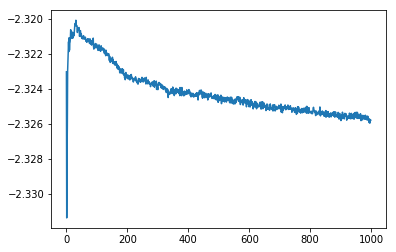

In [32]:
plt.plot(scores);

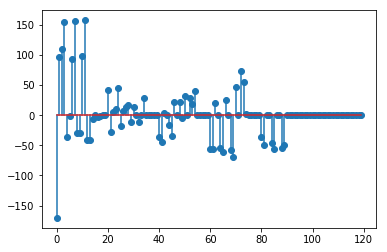

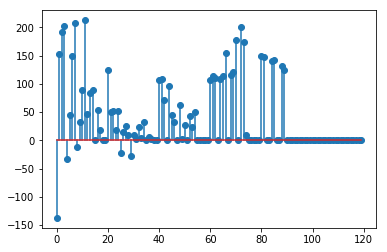

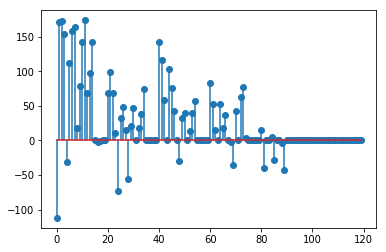

In [33]:
buvwx, buvwy, buvwz = T.reshape((3,-1))
plt.stem(buvwx);
plt.show();
plt.stem(buvwy);
plt.show();
plt.stem(buvwz);
plt.show();

# Draw results

In [34]:
local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
(T, 
  aligner.centroid_m, aligner.centroid_f,
  aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
  aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

Compute NuPx/NvPy/NwPz: 0.15 seconds.
Compute NuNvNw: 1.06 seconds.


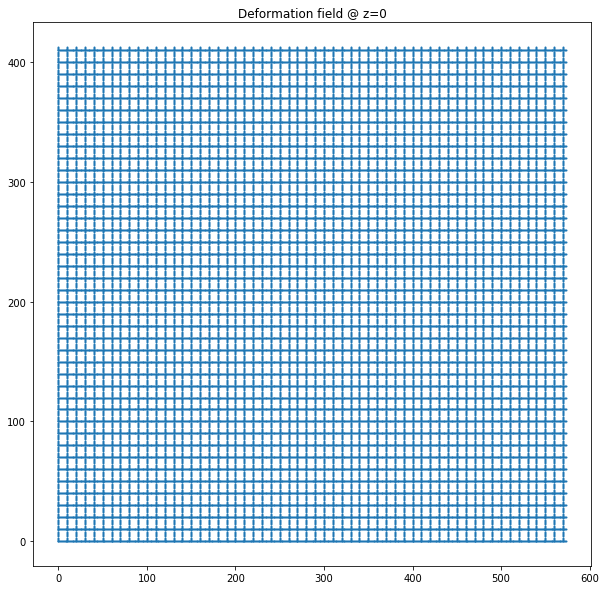

Compute NuPx/NvPy/NwPz: 0.15 seconds.
Compute NuNvNw: 1.05 seconds.


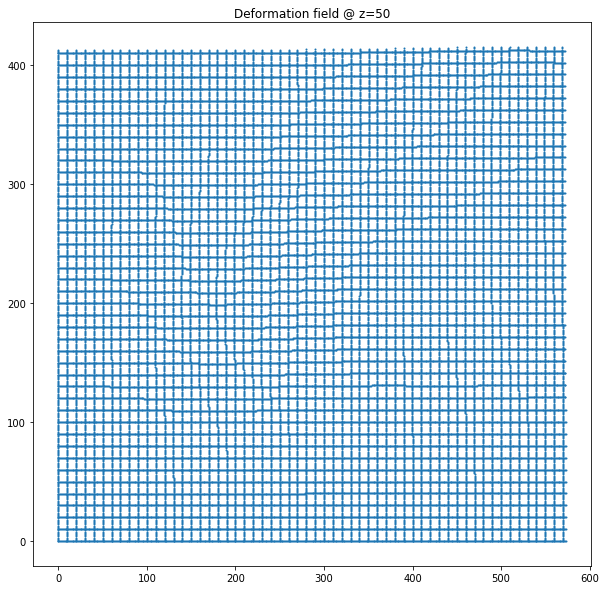

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 1.05 seconds.


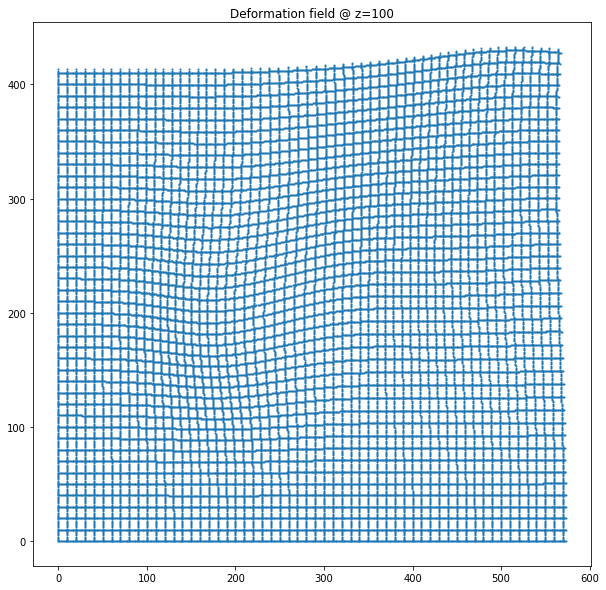

Compute NuPx/NvPy/NwPz: 0.15 seconds.
Compute NuNvNw: 1.05 seconds.


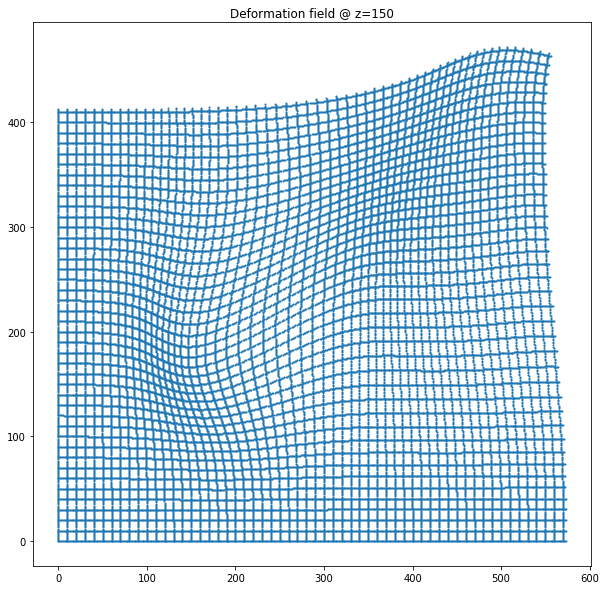

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 1.05 seconds.


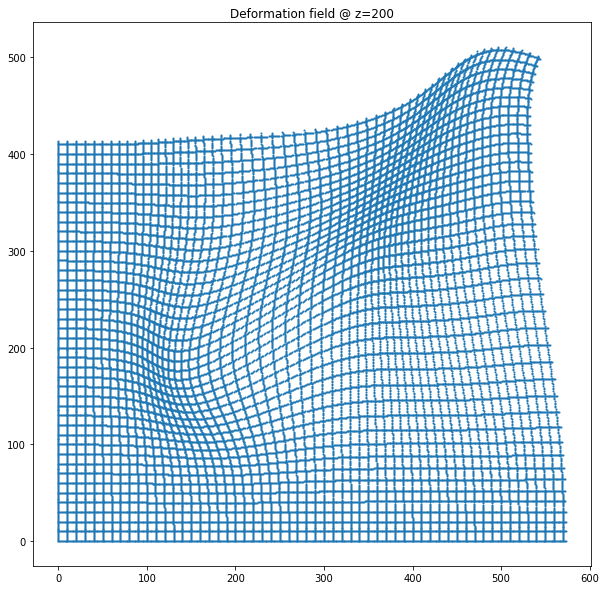

Compute NuPx/NvPy/NwPz: 0.15 seconds.
Compute NuNvNw: 1.05 seconds.


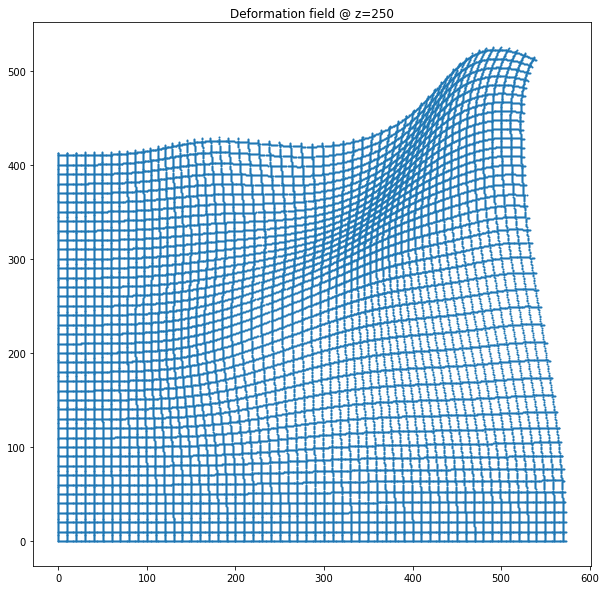

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 1.05 seconds.


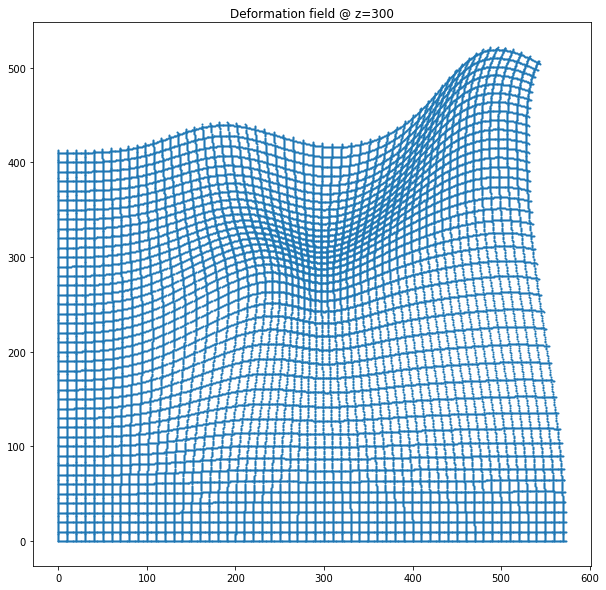

Compute NuPx/NvPy/NwPz: 0.15 seconds.
Compute NuNvNw: 1.04 seconds.


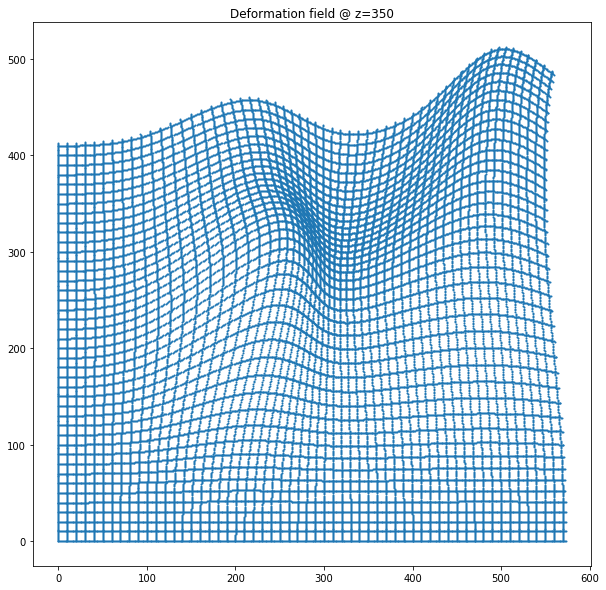

In [56]:
for z in range(0, volume_moving[1].shape[2], 50):

    def return_gridline_points(xs, ys, w, h, z):
        grid_points = np.array([(x,y,z) for x in range(w) for y in ys] + [(x,y,z) for x in xs for y in range(h)])
        return grid_points

    grid_points = return_gridline_points(range(0,volume_fixed[1].shape[1],10), 
                                         range(0,volume_fixed[1].shape[0],10), 
                                         volume_fixed[1].shape[1], 
                                         volume_fixed[1].shape[0], z)

    warped_grid_points = transform_points_bspline(buvwx, buvwy, buvwz, 
                                                  volume_shape=(xdim_m, ydim_m, zdim_m), interval=100, 
                                                  pts=grid_points, c=centroid_m, c_prime=centroid_f)

    plt.figure(figsize=(10, 10));
    plt.scatter(warped_grid_points[:,0], warped_grid_points[:,1], s=1)
    plt.title('Deformation field @ z=%d' % z)
    plt.show()

In [36]:
# local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
# ([1,0,0,0,0,1,0,0,0,0,1,0], 
#   aligner.centroid_m, aligner.centroid_f,
#   aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
#   aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

# Read global tx
# global_transformed_moving_structure_vols = \
# DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
#                                     classifier_setting_m=classifier_setting,
#                                     classifier_setting_f=classifier_setting,
#                                     warp_setting=upstream_warp_setting)

In [37]:
vols_m2f = {}
vols_m2f_bboxes = {}
vols_m2f_g = {}
vols_m2f_g_bboxes = {}

for ind_m, v in volume_moving.iteritems():
# for ind_m in [structure_to_label_moving['VLL_L']]:
#     v = volume_moving[ind_m]

    if label_to_structure_moving[ind_m] in structure_subset:

        vol_m2f_g_bbox = bbox_3d(v)
        vol_m2f_g_xmin, vol_m2f_g_xmax, vol_m2f_g_ymin, vol_m2f_g_ymax, vol_m2f_g_zmin, vol_m2f_g_zmax = vol_m2f_g_bbox
        vol_m2f_g = v[vol_m2f_g_ymin:vol_m2f_g_ymax+1, 
                                                            vol_m2f_g_xmin:vol_m2f_g_xmax+1,
                                                            vol_m2f_g_zmin:vol_m2f_g_zmax+1]

        vol_m2f, vol_m2f_bbox = \
        transform_volume_bspline((vol_m2f_g, vol_m2f_g_bbox), buvwx, buvwy, buvwz, 
                                 volume_shape=(xdim_m, ydim_m, zdim_m), 
                                 interval=100, 
                                 centroid_m=centroid_m, centroid_f=centroid_f)

        vols_m2f[ind_m] = vol_m2f
        vols_m2f_bboxes[ind_m] = vol_m2f_bbox

        vols_m2f_g[ind_m] = vol_m2f_g
        vols_m2f_g_bboxes[ind_m] = vol_m2f_g_bbox

Compute NuPx/NvPy/NwPz: 0.34 seconds.
Compute NuNvNw: 2.37 seconds.
Compute NuPx/NvPy/NwPz: 0.61 seconds.
Compute NuNvNw: 4.20 seconds.
Compute NuPx/NvPy/NwPz: 0.36 seconds.
Compute NuNvNw: 2.54 seconds.
Compute NuPx/NvPy/NwPz: 0.59 seconds.
Compute NuNvNw: 4.04 seconds.
Compute NuPx/NvPy/NwPz: 0.36 seconds.
Compute NuNvNw: 2.54 seconds.
Compute NuPx/NvPy/NwPz: 0.58 seconds.
Compute NuNvNw: 4.09 seconds.
Compute NuPx/NvPy/NwPz: 0.65 seconds.
Compute NuNvNw: 4.40 seconds.
Compute NuPx/NvPy/NwPz: 0.81 seconds.
Compute NuNvNw: 5.49 seconds.
Compute NuPx/NvPy/NwPz: 0.64 seconds.
Compute NuNvNw: 4.39 seconds.
Compute NuPx/NvPy/NwPz: 0.81 seconds.
Compute NuNvNw: 5.45 seconds.
Compute NuPx/NvPy/NwPz: 0.95 seconds.
Compute NuNvNw: 6.38 seconds.
Compute NuPx/NvPy/NwPz: 1.18 seconds.
Compute NuNvNw: 7.78 seconds.
Compute NuPx/NvPy/NwPz: 0.95 seconds.
Compute NuNvNw: 6.37 seconds.
Compute NuPx/NvPy/NwPz: 1.17 seconds.
Compute NuNvNw: 7.76 seconds.


In [62]:
# display_volume_sections(vols_m2f[structure_to_label_moving['7n_L']].astype(np.float))

In [38]:
# Set colors for different contour level
# levels = [0.1, 0.25, 0.5, 0.75, .99]
levels = [0.5]
level_colors = {level: (int(level*255),0,0) for level in levels} # after bspline, red
level_colors2 = {level: (0,int(level*255),0) for level in levels} # before bspline, green

In [39]:
c = 0

0 573 0 413 93 452
183


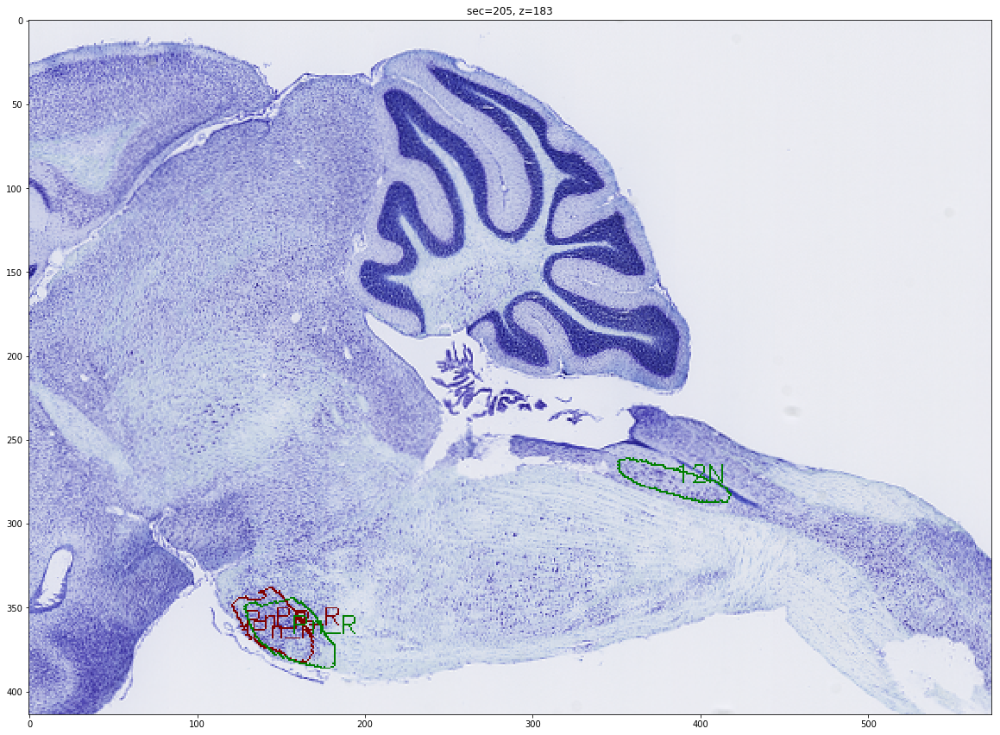

190
197


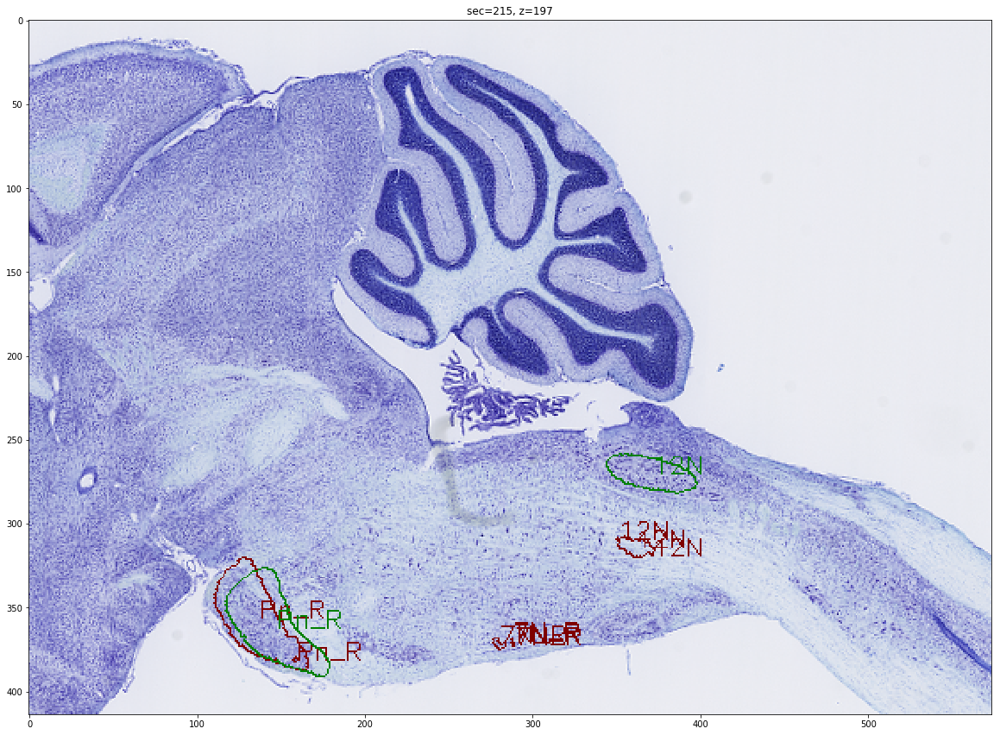

203


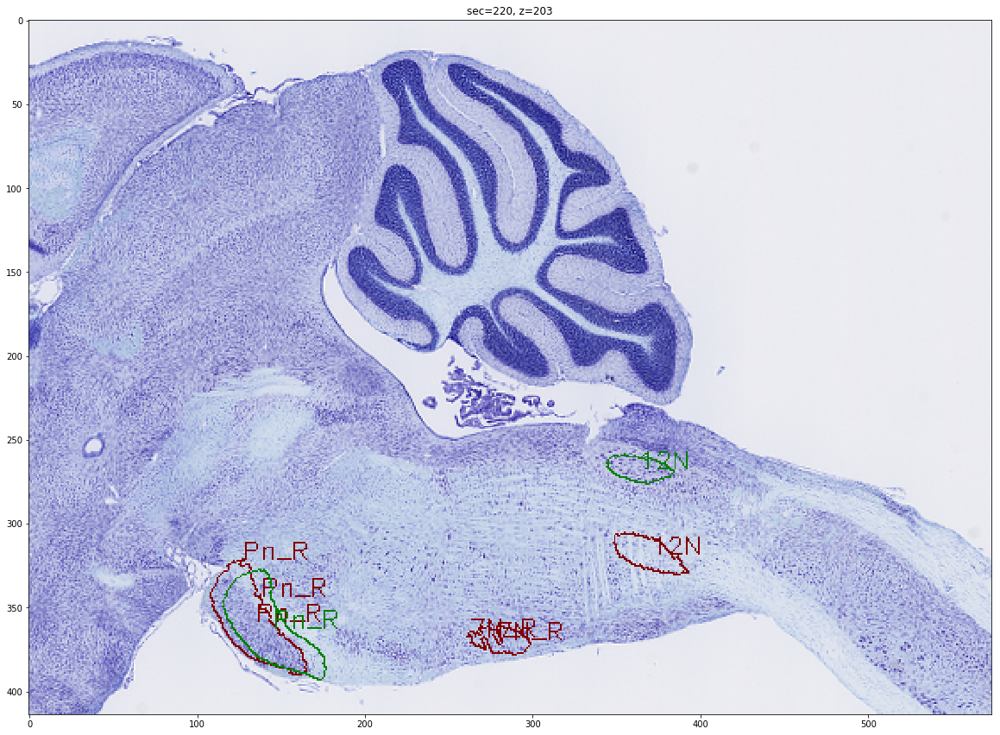

210


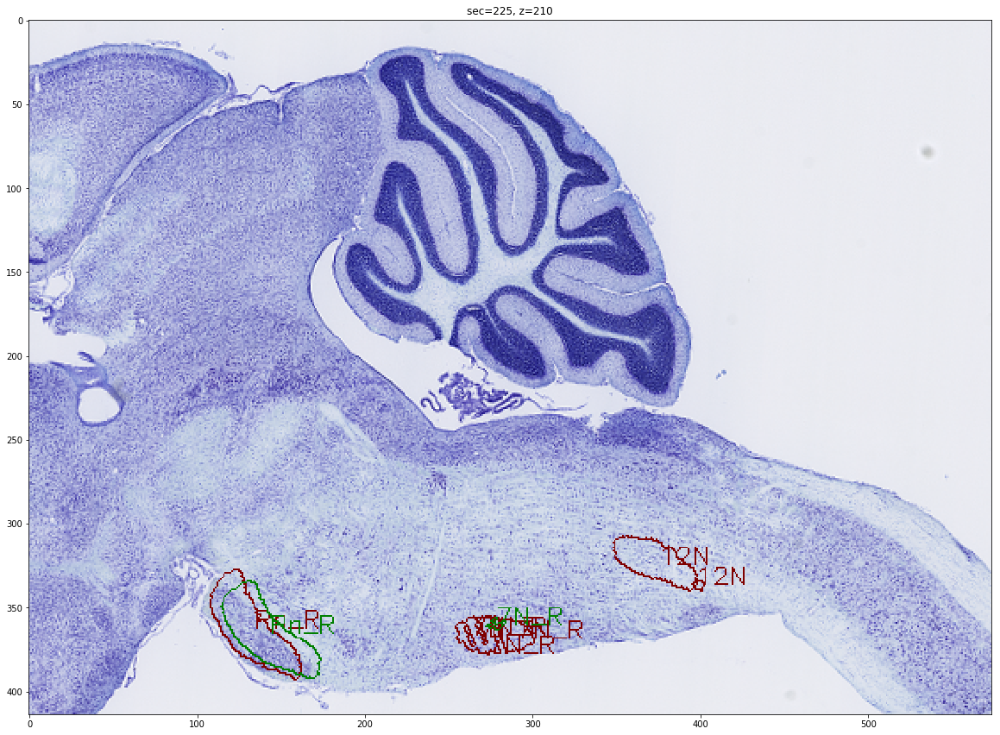

217


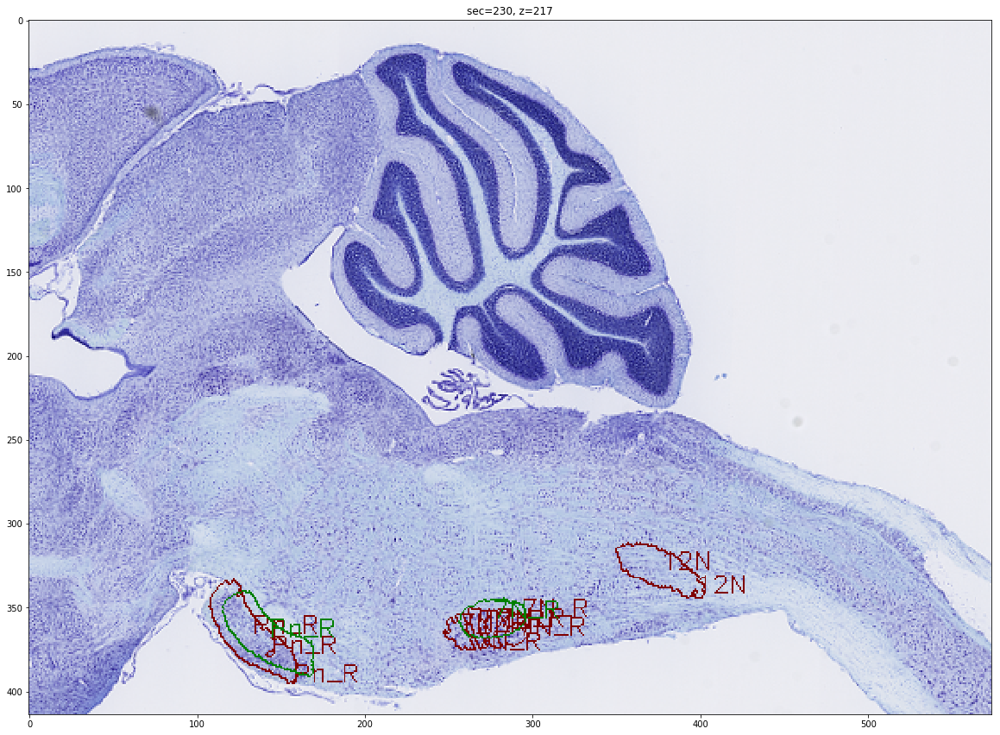

224


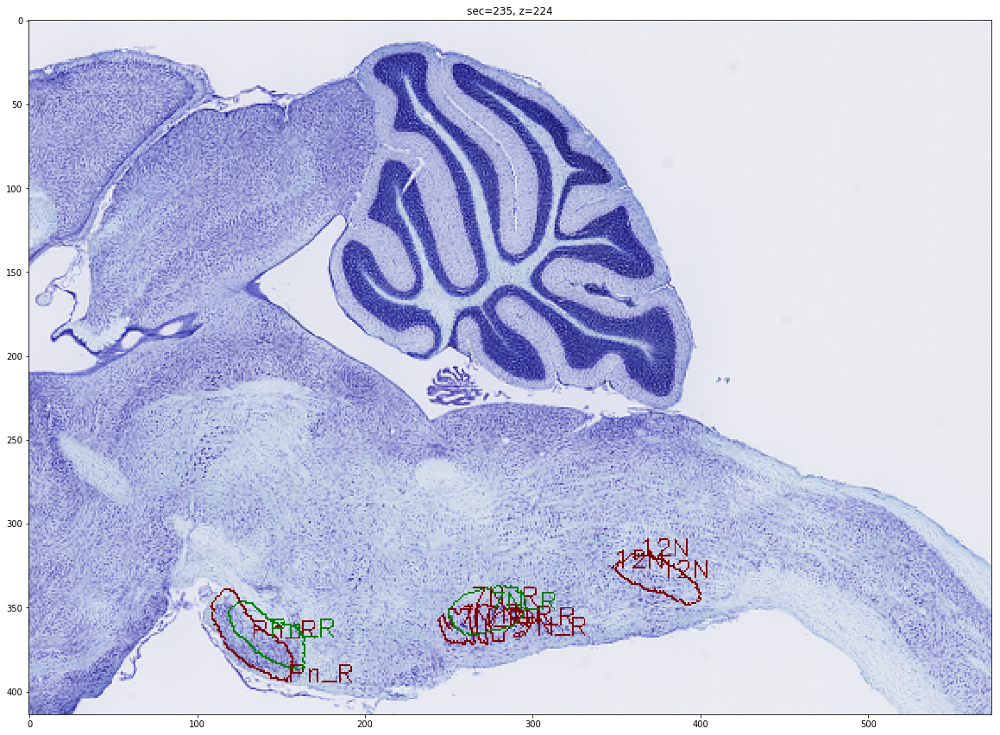

230


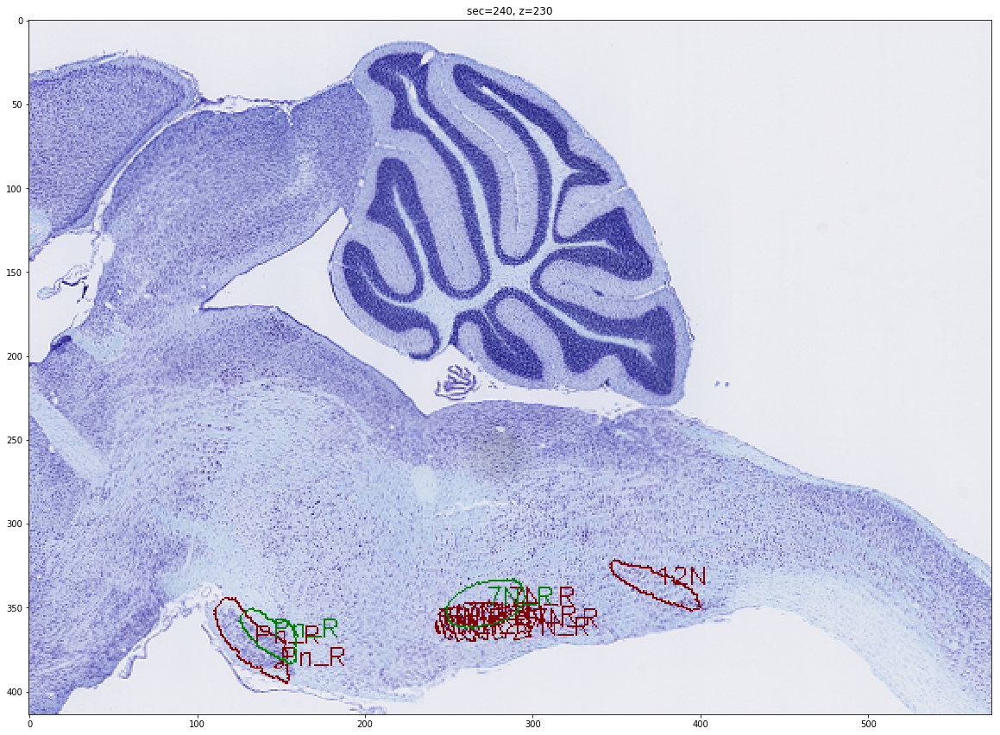

237


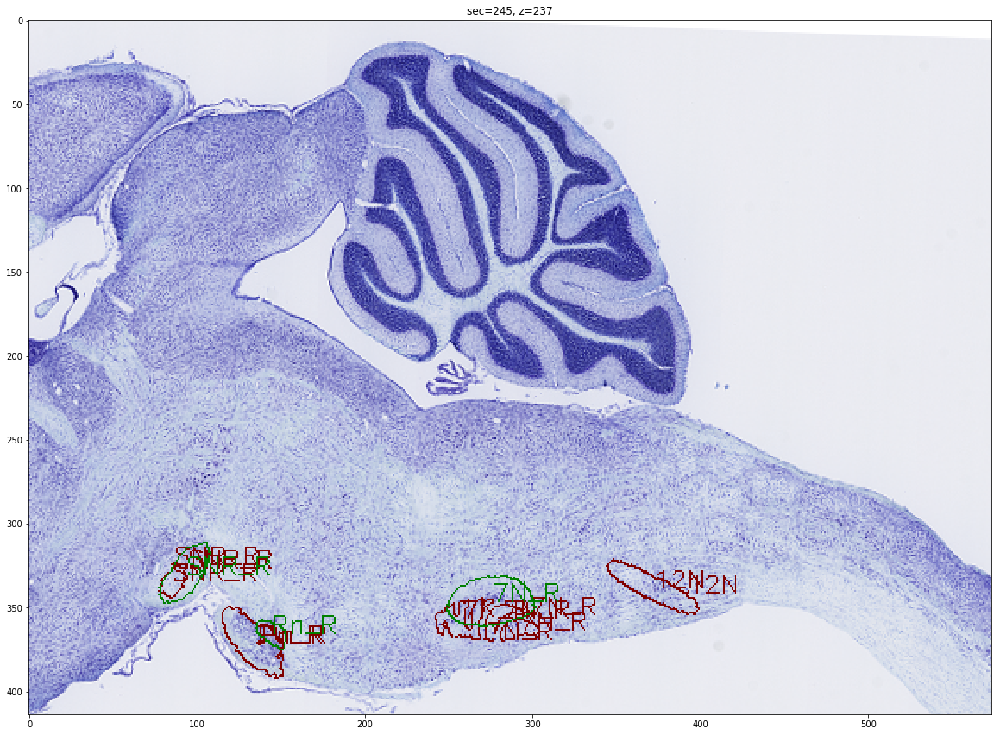

244


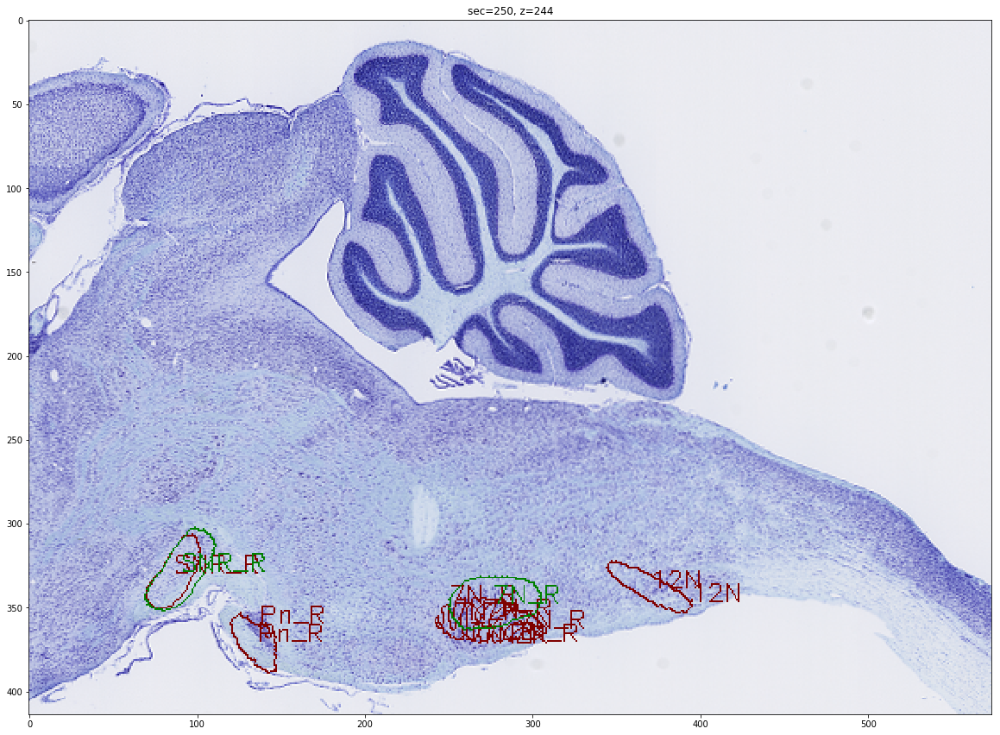

251


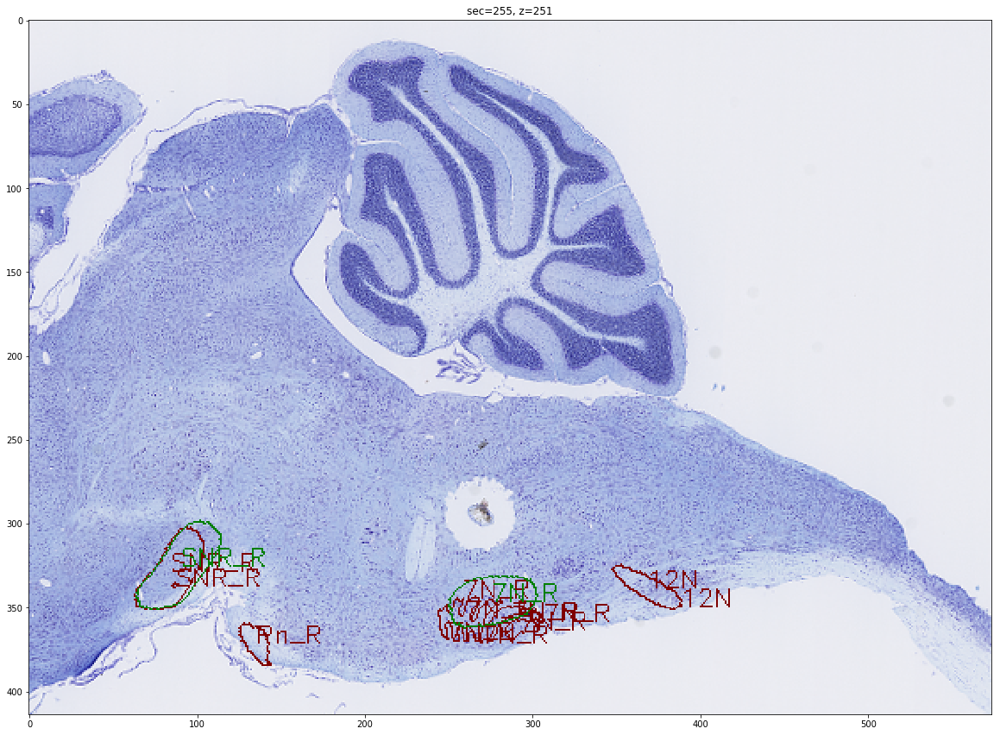

258


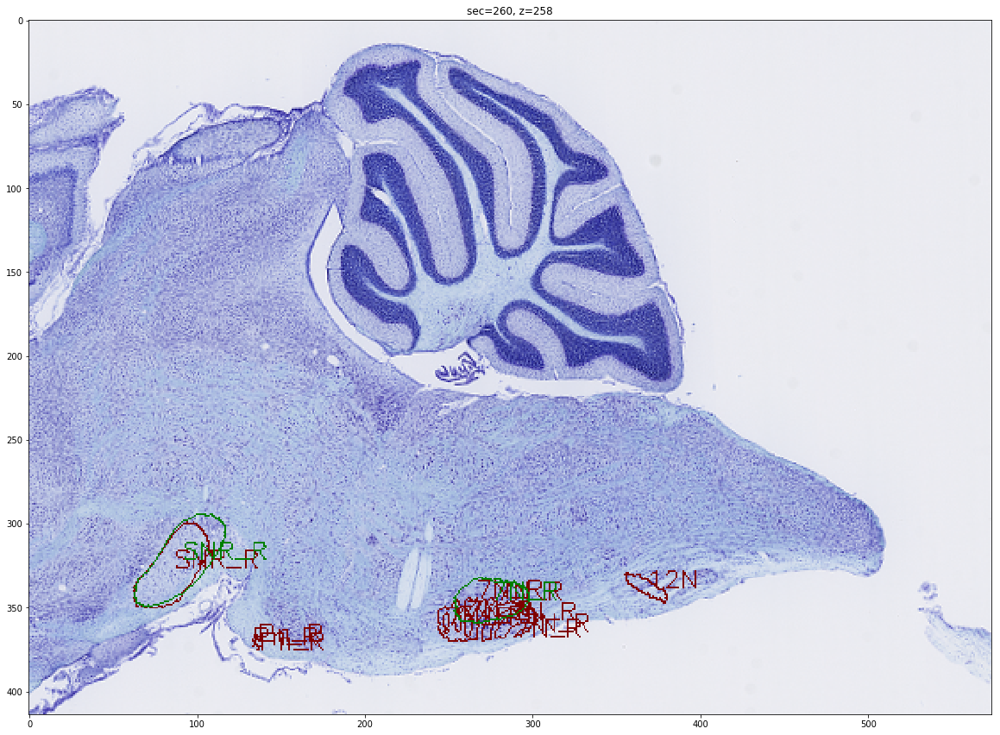

264


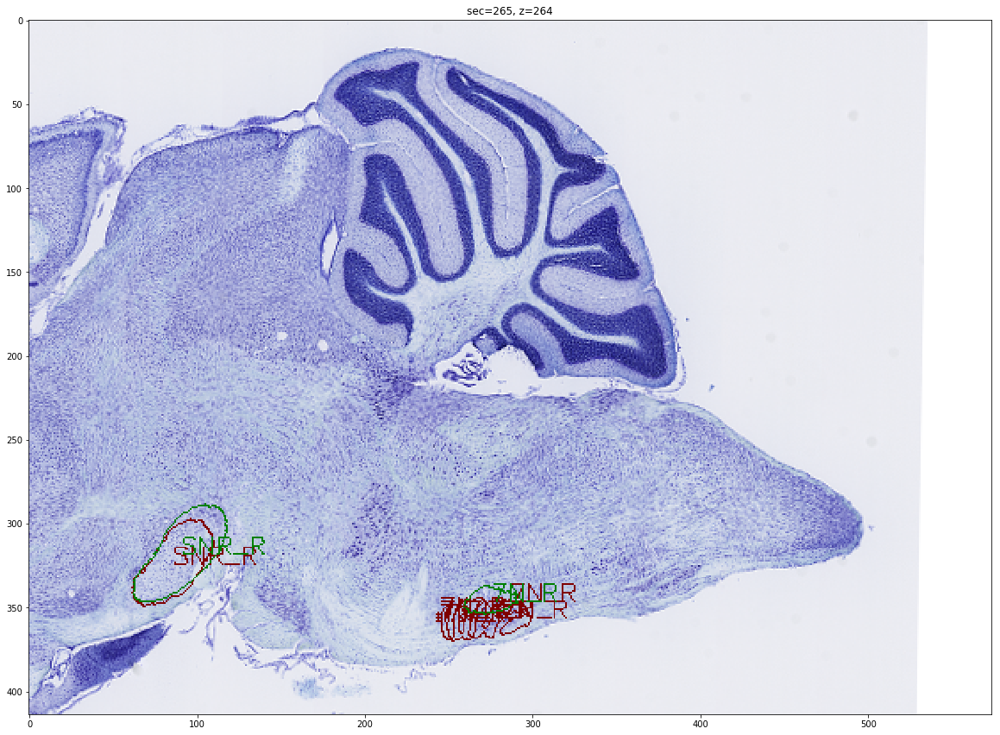

271


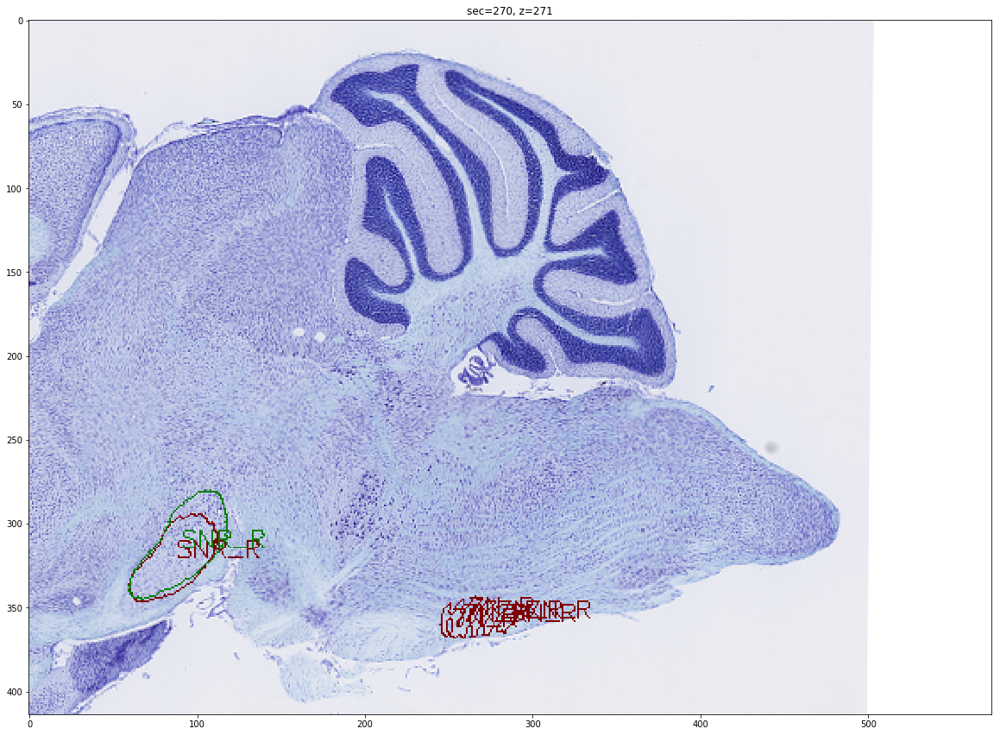

In [44]:
# Generate overlay visualization

# estimate mapping between z and section
# downsample_factor = 32
# xy_pixel_distance_downsampled = XY_PIXEL_DISTANCE_LOSSLESS * downsample_factor
# voxel_z_size = SECTION_THICKNESS / xy_pixel_distance_downsampled

# For getting correct contour location
xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='score', structure='7N', 
                             downscale=32, detector_id=detector_id, prep_id=2)
print xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f

# Generate atlas overlay image for every section

zf, zl = vols_m2f_bboxes[structure_to_label_moving['12N']][4:]
sec_first = DataManager.convert_z_to_section(stack=stack_fixed, z=zf, downsample=32)
sec_last = DataManager.convert_z_to_section(stack=stack_fixed, z=zl, downsample=32)

for sec in range(sec_first, sec_last+1, 5):
# for sec in [181]:

    if is_invalid(stack=stack_fixed, sec=sec):
        continue

    try:
        img = DataManager.load_image(stack=stack_fixed, section=sec, resol='thumbnail', version='cropped_tif')
#         sc_viz_fp = DataManager.get_scoremap_viz_filepath(stack=stack_fixed, section=sec, 
#                                                            downscale=32,
#                                                            structure=convert_to_original_name('7N_L'), 
#                                                            classifier_id=classifier_setting)
#         download_from_s3(sc_viz_fp)
#         img = imread(sc_viz_fp)
    except:
        sys.stderr.write('Error loading scoremap for section %d\n' % sec)
        continue

#     img = img[::4, ::4]

    viz = img.copy()

    z1, z2 = DataManager.convert_section_to_z(stack=stack_fixed, sec=sec, downsample=32)
    z = int(z1)
    print z
         
    # Find moving volume annotation contours
    
    for ind_m in vols_m2f.keys():
        
        if is_surround_label(label_to_structure_moving[ind_m]):
            continue
        
        vol_m2f = vols_m2f[ind_m]
        vol_m2f_bbox = vols_m2f_bboxes[ind_m]
        vol_m2f_g = vols_m2f_g[ind_m]
        vol_m2f_g_bbox = vols_m2f_g_bboxes[ind_m]
        
        # Show contours after bspline
        if z >= vol_m2f_bbox[4] and z < vol_m2f_bbox[4] + vol_m2f.shape[2]:

            c = 0
            for level in levels:
                cnts = find_contours(vol_m2f[..., z - vol_m2f_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_bbox[0], vol_m2f_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors[level], 1)
                    if level == 0.5:
                        cv2.putText(viz, label_to_structure_moving[ind_m], tuple(cnt_on_cropped.mean(axis=0).astype(np.int)), cv2.FONT_HERSHEY_SIMPLEX, .5, (level_colors[level]), 1)
            
        # Show contours before bspline
        if z >= vol_m2f_g_bbox[4] and z < vol_m2f_g_bbox[4] + vol_m2f_g.shape[2]:
                    
            for level in levels:
                cnts = find_contours(vol_m2f_g[..., z - vol_m2f_g_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_g_bbox[0], vol_m2f_g_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors2[level], 1)
                    if level == 0.5:
                        cv2.putText(viz, label_to_structure_moving[ind_m], tuple(cnt_on_cropped.mean(axis=0).astype(np.int)), cv2.FONT_HERSHEY_SIMPLEX, .5, (level_colors2[level]), 1)
                    
    if c > 0:    
        plt.figure(figsize=(20, 20));
        plt.title("sec=%d, z=%d" % (sec, z));
        plt.imshow(viz);
        plt.show();